# Load hc3 and/or DibaBuszakiData into nelpy

## TODO:
The idea here is to define the tables, and to read the data from the hc-3 or DibaBuzsakiData directories, and to put it all into standard nelpy containers. 

The necessary work is here, but it needs to be cleaned up, and possibly documentation added.

gor01 is complete. but vvp01 and ?pin01? still need more entries in the data table...

In [1]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import scipy.ndimage.filters
import os
import sys
import warnings
import numpy as np
import pickle
import random

import copy

from sklearn.model_selection import train_test_split
from mpl_toolkits.axes_grid1 import make_axes_locatable

import nelpy as nel
import nelpy.io # add additional functionality to nelpy on an as-needed basis
import nelpy.plotting as npl

npl.setup()

%matplotlib inline

from nelpy.hmmutils import *

## conda install pandas=0.19.2

In [2]:
warnings.filterwarnings("ignore")

In [3]:
datadirs = ['/home/etienne/Data/DibaBuzsakiData/']

# datadirs = ['C:/Etienne/Dropbox/neoReader/']


fileroot = next( (dir for dir in datadirs if os.path.isdir(dir)), None)

if fileroot is None:
    raise FileNotFoundError('datadir not found')

exp_data = dict()

load_from_nel = False

# load from nel file:
if load_from_nel:
    jar = nel.load_pkl(fileroot + 'gor01new.nel')
    df = jar.df
    exp_data = jar.exp_data
    del jar


In [155]:
df

,animal,month,day,time,track,segments,segment_labels,whl,n_cells,n_placecells,n_PBEs,Notes
0,vvp01,4,9,17-29-30,one,"[(0, 800), (905, 1395), (1445, 1660)]","(long, short, long2)",True,68,32,63,NaN
1,vvp01,4,10,12-25-50,one,"[(0, 870), (970, 1390)]","(long, short)",True,79,34,13,NaN
2,vvp01,4,10,21-2-40,one,"[(0, 590), (625, 937), (989, 1081)]","(long, short, long2)",True,83,48,6,NaN
3,vvp01,4,11,15-16-59,one,"[(0, 667), (734, 975)]","(long, short)",True,84,41,2,NaN
4,vvp01,4,12,14-39-31,one,"[(0, 581), (620, 887)]","(long, short)",True,68,35,2,NaN
5,vvp01,4,12,17-53-55,one,"[(0, 466), (534, 840), (888, 1178)]","(long, short, long2)",True,79,34,19,NaN
6,vvp01,4,16,15-12-23,one,"[(22, 528), (650, 997)]","(long, short)",True,74,24,57,NaN
7,vvp01,4,17,12-33-47,one,"[(9, 438), (459, 865)]","(long, short)",True,34,9,38,NaN
8,vvp01,4,18,13-6-1,one,"[(14, 496), (519, 795)]","(long, short)",True,69,20,39,NaN
9,vvp01,4,18,15-23-32,one,"[(8, 283), (295, 499)]","(long, short)",True,86,30,19,NaN


# Manually build experimental table

In [4]:
# this is not for hc-3, but rather for the same (but modified) dataset from Kamran Diba
# df = pd.DataFrame( columns=('animal', 'month', 'day', 'time', 'track', 'long_end', 'short_start', 'whl', 'num_cells', 'Notes'))
df = pd.DataFrame( columns=('animal', 'month', 'day', 'time', 'track', 'segments', 'segment_labels', 'whl', 'n_cells', 'Notes'))

df = df.append({'animal':'vvp01', 'month':4, 'day': 9,  'time':'17-29-30', 'whl':True, 'track':'one', 'segment_labels':('long','short','long2'), 'segments': [(0,800),(905,1395),(1445,1660)] }, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 10, 'time':'12-25-50', 'whl':True, 'track':'one', 'segment_labels':('long','short'), 'segments': [(0,870),(970,1390)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 10, 'time':'21-2-40',  'whl':True, 'track':'one', 'segment_labels':('long','short','long2'), 'segments': [(0,590),(625, 937),(989,1081)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 11, 'time':'15-16-59', 'whl':True, 'track':'one', 'segment_labels':('long','short'), 'segments': [(0,667),(734,975)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 12, 'time':'14-39-31', 'whl':True, 'track':'one', 'segment_labels':('long','short'), 'segments': [(0,581),(620,887)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 12, 'time':'17-53-55', 'whl':True, 'track':'one', 'segment_labels':('long','short','long2'), 'segments': [(0,466),(534, 840),(888,1178)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 16, 'time':'15-12-23', 'whl':True, 'track':'one', 'segment_labels':('long','short'), 'segments': [(22,528),(650,997)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 17, 'time':'12-33-47', 'whl':True, 'track':'one', 'segment_labels':('long','short'), 'segments': [(9,438),(459,865)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 18, 'time':'13-6-1',   'whl':True, 'track':'one', 'segment_labels':('long','short'), 'segments': [(14,496),(519,795)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 18, 'time':'15-23-32', 'whl':True, 'track':'one', 'segment_labels':('long','short'), 'segments': [(8,283),(295,499)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 19, 'time':'13-34-40', 'whl':True, 'track':'one', 'segment_labels':('long','short'), 'segments': [(10,394),(413,657)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 19, 'time':'16-48-9',  'whl':True, 'track':'one', 'segment_labels':('long','short'), 'segments': [(0,271),(359,601)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 21, 'time':'10-24-35', 'whl':True, 'track':'one', 'segment_labels':('long','short'), 'segments': [(14,465),(490,777)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 25, 'time':'14-28-51', 'whl':True, 'track':'one', 'segment_labels':('long','short'), 'segments': [(9,394),(405,616)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 25, 'time':'17-17-6',  'whl':True, 'track':'one', 'segment_labels':('long','short'), 'segments': [(7,316),(330,520)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 26, 'time':'13-22-13', 'whl':True, 'track':'one', 'segment_labels':('long','short'), 'segments': [(20,375),(415,614)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 27, 'time':'14-43-12', 'whl':True, 'track':'one', 'segment_labels':('long','top'), 'segments': [(9,611),(640,908)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 28, 'time':'12-17-27', 'whl':True, 'track':'one', 'segment_labels':('long','bottom'), 'segments': [(11,433),(446,677)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 28, 'time':'16-48-29', 'whl':True, 'track':'one', 'segment_labels':('long','bottom'), 'segments': [(6,347),(363,600)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 9,  'time':'16-40-54', 'whl':True, 'track':'two', 'segment_labels':('long','short'), 'segments': [(289,1150),(1224,1709)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 10, 'time':'12-58-3',  'whl':True, 'track':'two', 'segment_labels':('long','short'), 'segments': [(21,923),(984,1450)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 10, 'time':'19-11-57', 'whl':True, 'track':'two', 'segment_labels':('long','short'), 'segments': [(25,916),(1050,1477)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 11, 'time':'12-48-38', 'whl':True, 'track':'two', 'segment_labels':('long','short'), 'segments': [(8,705),(851,1284)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 11, 'time':'16-2-46',  'whl':True, 'track':'two', 'segment_labels':('long','short'), 'segments': [(10,578),(614,886)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 12, 'time':'14-59-23', 'whl':True, 'track':'two', 'segment_labels':('long','short'), 'segments': [(7,284)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 12, 'time':'15-25-59', 'whl':True, 'track':'two', 'segment_labels':('long','short'), 'segments': [(13,462),(498,855)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 16, 'time':'14-49-24', 'whl':True, 'track':'two', 'segment_labels':('long','short'), 'segments': [(14,749),(773,1035)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 16, 'time':'18-47-52', 'whl':True, 'track':'two', 'segment_labels':('long','short'), 'segments': [(13,433),(444,752)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 17, 'time':'12-52-15', 'whl':True, 'track':'two', 'segment_labels':('long','short'), 'segments': [(13,464),(473,801)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 18, 'time':'13-28-57', 'whl':True, 'track':'two', 'segment_labels':('long','short'), 'segments': [(0,396),(404,619)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 18, 'time':'15-38-2',  'whl':True, 'track':'two', 'segment_labels':('long','short'), 'segments': [(13,307),(316,510)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 19, 'time':'13-50-7',  'whl':True, 'track':'two', 'segment_labels':('long','short'), 'segments': [(9,297),(304,505)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 19, 'time':'16-37-40', 'whl':True, 'track':'two', 'segment_labels':('long','short'), 'segments': [(17,279),(289,467)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 21, 'time':'11-19-2',  'whl':True, 'track':'two', 'segment_labels':('long','short'), 'segments': [(6,358),(363,577)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 25, 'time':'13-20-55', 'whl':True, 'track':'two', 'segment_labels':('long','short'), 'segments': [(30,334),(348,569)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 25, 'time':'17-33-28', 'whl':True, 'track':'two', 'segment_labels':('long','short'), 'segments': [(10,277),(286,456)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 26, 'time':'13-51-50', 'whl':True, 'track':'two', 'segment_labels':('long','short','long2'), 'segments': [(9,317),(324,506),(515,766)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 27, 'time':'18-21-57', 'whl':True, 'track':'two', 'segment_labels':('long','top'), 'segments': [(13,279),(292,493)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 28, 'time':'12-38-13', 'whl':True, 'track':'two', 'segment_labels':('long','bottom'), 'segments': [(5,286),(291,526)]}, ignore_index=True)
df = df.append({'animal':'vvp01', 'month':4, 'day': 28, 'time':'17-6-14',  'whl':True, 'track':'two', 'segment_labels':('long','bottom','short'), 'segments': [(8,343),(350,593), (617,791)]}, ignore_index=True)

df = df.append({'animal':'gor01', 'month':6, 'day': 7,  'time':'11-26-53', 'track':'one',   'whl':True, 'segment_labels':('long'),         'segments': [(0,1730)], 'Notes':'missing position data for short segment' }, ignore_index=True)
df = df.append({'animal':'gor01', 'month':6, 'day': 7,  'time':'16-40-19', 'track':'two',   'whl':True, 'segment_labels':('long','short'), 'segments': [(0,1180),(1250,2580)], 'Notes': 'there is a .whl_back file---what is this?' }, ignore_index=True)
df = df.append({'animal':'gor01', 'month':6, 'day': 12, 'time':'15-55-31', 'track':'one',   'whl':True, 'segment_labels':('long','short'), 'segments': [(0,660),(710,1120)]}, ignore_index=True)
df = df.append({'animal':'gor01', 'month':6, 'day': 12, 'time':'16-53-46', 'track':'two',   'whl':True, 'segment_labels':('long','short'), 'segments': [(0,470),(490,796)]}, ignore_index=True)
df = df.append({'animal':'gor01', 'month':6, 'day': 13, 'time':'14-42-6',  'track':'one',   'whl':True, 'segment_labels':('long','short'), 'segments': [(0,520),(540,845)]}, ignore_index=True)
df = df.append({'animal':'gor01', 'month':6, 'day': 13, 'time':'15-22-3',  'track':'two',   'whl':True, 'segment_labels':('long','short'), 'segments': [(0,530),(540,865)]}, ignore_index=True)
df = df.append({'animal':'gor01', 'month':6, 'day': 8,  'time':'15-46-47', 'track':'two',   'whl':True, 'segment_labels':('long'),         'segments': [(0,2400)], 'Notes': 'short segment seems bad' }, ignore_index=True)
df = df.append({'animal':'gor01', 'month':6, 'day': 8,  'time':'21-16-25', 'track':'two',   'whl':True, 'segment_labels':('long','short'), 'segments': [(0,720),(750,1207)]}, ignore_index=True)
df = df.append({'animal':'gor01', 'month':6, 'day': 9,  'time':'22-24-40', 'track':'two',   'whl':True, 'segment_labels':('long','short'), 'segments': [(0,912),(920,2540)]}, ignore_index=True)
df = df.append({'animal':'gor01', 'month':6, 'day': 8,  'time':'14-26-15', 'track':'one',   'whl':False, 'segment_labels':(''),            'segments': []}, ignore_index=True)
df = df.append({'animal':'gor01', 'month':6, 'day': 9,  'time':'1-22-43',  'track':'one',   'whl':True, 'segment_labels':('long','short'), 'segments': [(0,1012),(1035,1652)]}, ignore_index=True)
df = df.append({'animal':'gor01', 'month':6, 'day': 9,  'time':'3-23-37',  'track':'one',   'whl':True, 'segment_labels':('long'),         'segments': [(28,530)], 'Notes': 'no short segment?' }, ignore_index=True)
df = df.append({'animal':'gor01', 'month':6, 'day': 8,  'time':'10-43-37', 'track':'sleep', 'whl':False, 'segment_labels':('sleep'),       'segments': []}, ignore_index=True)
df = df.append({'animal':'gor01', 'month':6, 'day': 8,  'time':'17-26-16', 'track':'sleep', 'whl':False, 'segment_labels':('sleep'),       'segments': []}, ignore_index=True)

df.month = df.month.astype(np.int64)
df.day = df.day.astype(np.int64)

df[(df.animal=='gor01') & (df.whl == True)]

,animal,month,day,time,track,segments,segment_labels,whl,n_cells,Notes
40,gor01,6,7,11-26-53,one,"[(0, 1730)]",long,True,NaN,missing position data for short segment
41,gor01,6,7,16-40-19,two,"[(0, 1180), (1250, 2580)]","(long, short)",True,NaN,there is a .whl_back file---what is this?
42,gor01,6,12,15-55-31,one,"[(0, 660), (710, 1120)]","(long, short)",True,NaN,NaN
43,gor01,6,12,16-53-46,two,"[(0, 470), (490, 796)]","(long, short)",True,NaN,NaN
44,gor01,6,13,14-42-6,one,"[(0, 520), (540, 845)]","(long, short)",True,NaN,NaN
45,gor01,6,13,15-22-3,two,"[(0, 530), (540, 865)]","(long, short)",True,NaN,NaN
46,gor01,6,8,15-46-47,two,"[(0, 2400)]",long,True,NaN,short segment seems bad
47,gor01,6,8,21-16-25,two,"[(0, 720), (750, 1207)]","(long, short)",True,NaN,NaN
48,gor01,6,9,22-24-40,two,"[(0, 912), (920, 2540)]","(long, short)",True,NaN,NaN
50,gor01,6,9,1-22-43,one,"[(0, 1012), (1035, 1652)]","(long, short)",True,NaN,NaN


In [5]:
# compute MUA from spike trains:
def get_mua(st):
    # collapse spike trains across all units
    mua_spks = st.flatten(unit_label='mua')

    # bin spikes into 1 ms bins, so that we can smooth the spike times
    ds_1ms = 0.001  # bin width of 1 ms
    mua_binned = mua_spks.bin(ds=ds_1ms)

    # smooth MUA spike train (this is our estimated mua firing 'rate')
    sigma = 0.010 / ds_1ms # 10 ms standard deviation
    bw = 6 # bandwidth of filter (outside of this bandwidth, the filter is zero)
    smoothed_spikes = scipy.ndimage.filters.gaussian_filter1d(np.squeeze(mua_binned.data.astype(float)), 
                                                              sigma=sigma, truncate=bw)

    # store MUA firing 'rate' in an AnalogSignalArray
    mua = nel.AnalogSignalArray(ydata=smoothed_spikes/ds_1ms, timestamps=mua_binned.bin_centers, step=ds_1ms) # in Hz
    
    return mua

### Extract CRCNS hc-3 data

In [6]:
exp_series = df[(df.animal=='gor01') & (df.time=='16-40-19')].iloc[0]
print(exp_series)

exp_kws = dict(fileroot = fileroot,
               animal = exp_series['animal'],
               sessiontime = exp_series['time'],
               month = exp_series['month'],
               day = exp_series['day'],
               track = exp_series['track'],
               verbose = False)

exp_kws

animal                                                gor01
month                                                     6
day                                                       7
time                                               16-40-19
track                                                   two
segments                          [(0, 1180), (1250, 2580)]
segment_labels                                (long, short)
whl                                                    True
n_cells                                                 NaN
Notes             there is a .whl_back file---what is this?
Name: 41, dtype: object


{'animal': 'gor01',
 'day': 7,
 'fileroot': '/home/etienne/Data/DibaBuzsakiData/',
 'month': 6,
 'sessiontime': '16-40-19',
 'track': 'two',
 'verbose': False}

In [7]:
# animal = 'gor01'
# animal = 'vvp01'
day = 7
# sessions = df[(df.animal==animal) & (df.day==day)]['time'].values.tolist()
# sessions = df[(df.animal==animal) & (df.whl==True)]['time'].values.tolist()
sessions = df[df.whl==True]['time'].values.tolist()
print(sessions)

session = '16-40-19' # choose session to work with 

['17-29-30', '12-25-50', '21-2-40', '15-16-59', '14-39-31', '17-53-55', '15-12-23', '12-33-47', '13-6-1', '15-23-32', '13-34-40', '16-48-9', '10-24-35', '14-28-51', '17-17-6', '13-22-13', '14-43-12', '12-17-27', '16-48-29', '16-40-54', '12-58-3', '19-11-57', '12-48-38', '16-2-46', '14-59-23', '15-25-59', '14-49-24', '18-47-52', '12-52-15', '13-28-57', '15-38-2', '13-50-7', '16-37-40', '11-19-2', '13-20-55', '17-33-28', '13-51-50', '18-21-57', '12-38-13', '17-6-14', '11-26-53', '16-40-19', '15-55-31', '16-53-46', '14-42-6', '15-22-3', '15-46-47', '21-16-25', '22-24-40', '1-22-43', '3-23-37']


In [8]:
exp_data = dict()

for s in sessions:

    exp_data[s] = dict()
    exp_series = df[df.time==s].iloc[0]
    
    try:
        exp_kws = dict(fileroot = fileroot,
               animal = exp_series['animal'],
               sessiontime = exp_series['time'],
               month = exp_series['month'],
               day = exp_series['day'],
               track = exp_series['track'],
               verbose = False)
    except KeyError:
        break

    exp_data[s]['spikes'] = nel.io.hc3.load_hc3_data(datatype='spikes', fs=32552, includeUnsortedSpikes=True, **exp_kws)
    exp_data[s]['eeg'] = nel.io.hc3.load_hc3_data(datatype='eeg', channels=[2], fs=1252, starttime=0, **exp_kws)
    posdf = nel.io.hc3.load_hc3_data(datatype='pos', fs=60, **exp_kws)
    exp_data[s]['pos'] = nel.AnalogSignalArray(ydata=np.vstack((posdf['x'], posdf['y'])), timestamps=posdf['time'].values, fs=60)


In [147]:
vvplines = [[(0,800),(905,1395),(1445,1660)],
          [(0,870),(970,1390)],
          [(0,590),(625, 937),(989,1081)],
          [(0,667),(734,975)],
          [(0,581),(620,887)],
          [(0,466),(534, 840),(888,1178)],
          [(22,528),(650,997)],
          [(9,438),(459,865)],
          [(14,496),(519,795)],
          [(8,283),(295,499)],
          [(10,394),(413,657)],
          [(0,271),(359,601)],
          [(14,465),(490,777)],
          [(9,394),(405,616)],
          [(7,316),(330,520)],
          [(20,375),(415,614)],
          [(9,611),(640,908)],
          [(11,433),(446,677)],
          [(6,347),(363,600)],
          [(289,1150),(1224,1709)],
          [(21,923),(984,1450)],
          [(25,916),(1050,1477)],
          [(8,705),(851,1284)],
          [(10,578),(614,886)],
          [(7,284)],
          [(13,462),(498,855)],
          [(14,749),(773,1035)],
          [(13,433),(444,752)],
          [(13,464),(473,801)],
          [(0,396),(404,619)],
          [(13,307),(316,510)],
          [(9,297),(304,505)],
          [(17,279),(289,467)],
          [(6,358),(363,577)],
          [(30,334),(348,569)],
          [(10,277),(286,456)],
          [(9,317),(324,506),(515,766)],
          [(13,279),(292,493)],
          [(5,286),(291,526)],
          [(8,343),(350,593), (617,791)]
         ]

vvpsegmentlabels = [
    ('long','short','long2'),
    ('long','short'),
    ('long','short','long2'),
    ('long','short'),
    ('long','short'),   
    ('long','short','long2'),
    ('long','short'),
    ('long','short'),
    ('long','short'),
    ('long','short'),
    ('long','short'),
    ('long','short'),
    ('long','short'),
    ('long','short'),
    ('long','short'),
    ('long','short'),
    ('long','top'),
    ('long','bottom'),
    ('long','bottom'),
    ('long','short'),
    ('long','short'),
    ('long','short'),
    ('long','short'),
    ('long','short'),
    ('long','short'),
    ('long','short'),
    ('long','short'),
    ('long','short'),
    ('long','short'),
    ('long','short'),
    ('long','short'),
    ('long','short'),
    ('long','short'),
    ('long','short'),
    ('long','short'),
    ('long','short'),
    ('long','short','long2'),
    ('long','top'),
    ('long','bottom'),
    ('long','bottom','short'),  
]

In [62]:
gorlines = [[(0,1730),(1900,1970)],
            [(0,1180),(1250,2580)],
            [(0,660),(710,1120)],
            [(0,470),(490,796)],
            [(0,520),(540,845)],
            [(0,530),(540,865)],
            [(0,2400)],
            [(0,720),(750,1207)],
            [(0,912),(920,2540)],
            [(0,1012),(1035,1652)],
            [(28,530)]
           ]

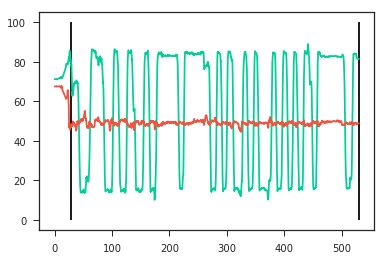

In [65]:
ii = 10
ax = npl.plot(exp_data[sessions[ii]]['pos'])
try:
    for (start, stop) in gorlines[ii]:
        ax.vlines((start,stop), 0, 100)
except:
    pass


1 11-26-53


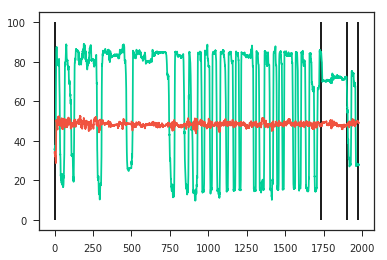

2 16-40-19


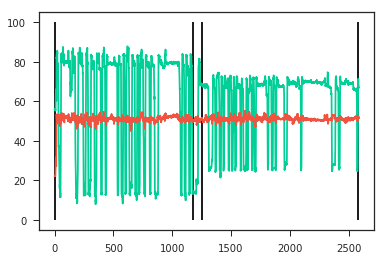

3 15-55-31


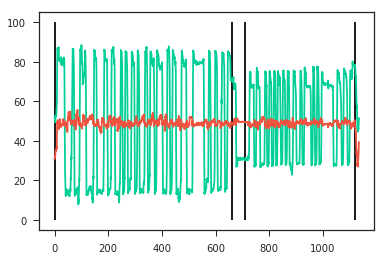

4 16-53-46


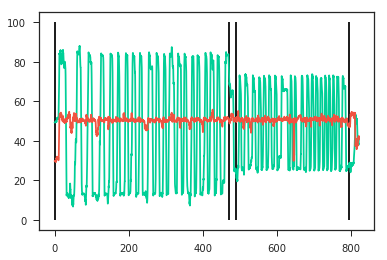

5 14-42-6


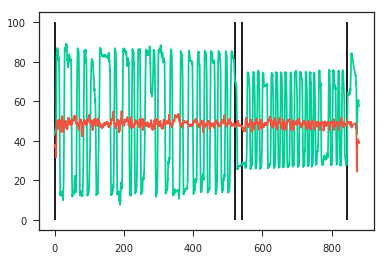

6 15-22-3


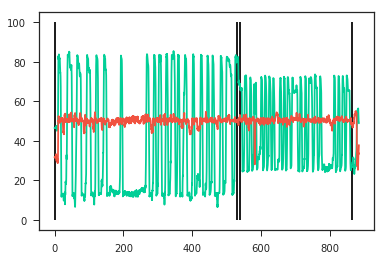

7 15-46-47


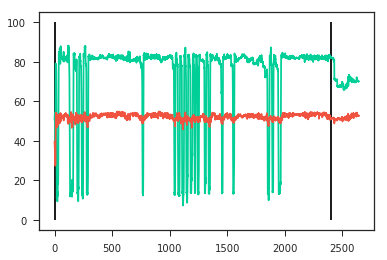

8 21-16-25


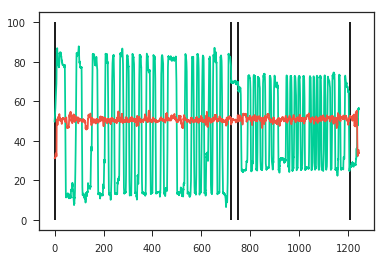

9 22-24-40


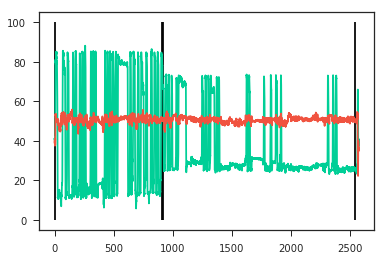

10 1-22-43


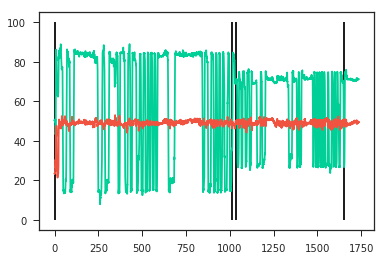

11 3-23-37


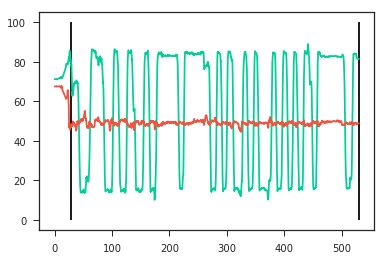

In [67]:
for ii, s in enumerate(sessions):
    print(ii+1, s)
    ax = npl.plot(exp_data[s]['pos'])
    try:
        for (start, stop) in vvplines[ii]:
            ax.vlines((start,stop), 0, 100)
    except:
        pass
    
    plt.show()

In [9]:
v1run=10; v2run=8 # for running epochs (approx in cm/s)
v1rest=3; v2rest=5 # for rest epochs (approx in cm/s)
std_devs_above_mean = 3 # for PBE detection
min_PBE_length = 0.08 # 80 ms or 4 20-ms bins
min_cells_active = 4 # for PBE

In [10]:
# jar = nel.ResultsContainer(df=df, exp_data=exp_data, description="all gor with whl")
# jar.save_pkl('new_gor01.nel')

In [11]:
from sklearn.decomposition import PCA # for position linearization

for s in sessions:
    try:
        # do some fixing up of the data objects (splitting by track length changes)
        domain = copy.copy(exp_data[s]['spikes'].support)
        
        segments = df[df.time==s]['segments'].values.squeeze().tolist()
        st_support = nel.EpochArray(segments)
               
        exp_data[s]['spikes'] = exp_data[s]['spikes'][st_support]
        exp_data[s]['spikes'].support.domain = domain  
        exp_data[s]['pos2d'] = exp_data[s]['pos'][st_support]
        exp_data[s]['pos2d'] = exp_data[s]['pos2d']*3.3 - 10 # approximate scaling to get 2.5 m track

        # now compute the MUA including the unsorted cells
        exp_data[s]['mua'] = get_mua(exp_data[s]['spikes'])
        # then remove the unsorted cells from the spike trains
        exp_data[s]['spikes'] = exp_data[s]['spikes'][:,(np.array(exp_data[s]['spikes'].unit_ids)[1:]).tolist()]
        
        # and update dataframe to show number of sorted cells
        idx = df[df.time==s].index
        df.set_value(idx, 'n_cells', exp_data[s]['spikes'].n_units)

        # smooth position estimates
        sigma = 0.1 # 100 ms std dev
        exp_data[s]['pos2d'] = nel.utils.gaussian_filter(exp_data[s]['pos2d'], sigma=sigma)

        # linearize position estimates
        X = exp_data[s]['pos2d']._ydata_colsig   # we access the 
        pca = PCA(n_components=1)
        Xlinear = pca.fit_transform(X)
        Xlinear = Xlinear - Xlinear.min() # start at 0
        exp_data[s]['pos1d'] = nel.AnalogSignalArray(ydata=Xlinear,
                                                     timestamps=exp_data[s]['pos2d'].time,
                                                     support=exp_data[s]['pos2d'].support, 
                                                     fs=exp_data[s]['pos2d'].fs)

        # compute running speed (from 1d position; could also do it from 2d without any problem...)
        sigma = 0.3
        exp_data[s]['speed'] = nel.utils.dxdt_AnalogSignalArray(exp_data[s]['pos1d'], smooth=True, sigma=sigma)
        
        # determine running and rest epochs
        exp_data[s]['run_epochs'] = nel.utils.get_run_epochs(exp_data[s]['speed'], v1=v1run, v2=v2run)
        exp_data[s]['rest_epochs'] = nel.utils.get_inactive_epochs(exp_data[s]['speed'], v1=v1rest, v2=v2rest)

        # PBE detection
        exp_data[s]['mua_epochs'] = nel.utils.get_mua_events(mua=exp_data[s]['mua'],
                                              PrimaryThreshold=exp_data[s]['mua'].mean() + std_devs_above_mean*exp_data[s]['mua'].std(),
                                              minLength=min_PBE_length)
        
#         num_active_per_PBE = [st.n_active for st in st2[mua_epochs]] # here we may want to impose some criteria,
            # or we may require the critaria on place cells (not ideal for HMM approach), in which case we must
            # do it later...
        
    except KeyError:
        break
try:
    st = exp_data[session]['spikes']
    pos = exp_data[session]['pos1d']
    mua = exp_data[session]['mua']
except KeyError:
    pass


In [14]:
min_cells_active = 4 # minimum number of active cells (not only place cells, but we can modify it if need be)
speed_threshold = 5 # cm/s max for PBEs (rest was <(3,5) while run was >(10,8))

segments_to_consider = ['long', 'short'] # ignore 'top', 'bottom', and 'long2' segments

aux_data = dict()

for session in sessions:
    print(session)
    aux_data[session] = dict()
    for segment in segments_to_consider:
        s = np.argwhere([segment == segment_label for segment_label in df[df.time==session]['segment_labels'].values.tolist()[0]])
        if len(s) > 0:
            s = int(s)
        else:
            print('segment type not in session; skipping...')
            continue
        
        if exp_data[session]['spikes'][s].isempty:
            print('encountered empty segment; skipping...')
            continue
        
        st_run = exp_data[session]['spikes'][s][exp_data[session]['run_epochs']]
        
        if st_run.support.duration < 10:
            print('encountered empty segment; skipping...')
            continue
            
        aux_data[session][segment] = dict()

        # smooth and re-bin:
        ds_run = 0.5 # bin run segments into 500 ms bins for place field estimation
        ds_50ms = 0.05
        sigma = 0.3 # 300 ms spike smoothing
        bst_run = st_run.bin(ds=ds_50ms).smooth(sigma=sigma, inplace=True).rebin(w=ds_run/ds_50ms)

        sigma = 6.2 # smoothing std dev in cm
        tc = nel.TuningCurve1D(bst=bst_run, extern=exp_data[session]['pos1d'], n_extern=100, extmin=0, extmax=310, sigma=sigma, min_duration=0)
        tc = tc.reorder_units()

        ## now identify likely place cells, since these will be the only ones shown in the rasters...

        # set criteria for units used in decoding
        min_peakfiringrate = 2 # Hz
        max_avgfiringrate = 5 # Hz
        peak_to_mean_ratio_threshold = 3 # peak firing rate should be greater than 3.5 times mean firing rate

        # unimodal_cells = find_unimodal_tuningcurves1D(smoothed_rate, peakthresh=0.5)

        # enforce minimum peak firing rate
        unit_ids_to_keep = set(np.asanyarray(tc.unit_ids)[np.argwhere(tc.ratemap.max(axis=1)>min_peakfiringrate).squeeze().tolist()])
        # enforce maximum average firing rate
        unit_ids_to_keep = unit_ids_to_keep.intersection(set( np.asanyarray(tc.unit_ids)[np.argwhere(tc.ratemap.mean(axis=1)<max_avgfiringrate).squeeze().tolist()]   ))

        # enforce peak to mean firing ratio
        peak_firing_rates = tc.max(axis=1)
        mean_firing_rates = tc.mean(axis=1)
        ratio = peak_firing_rates/mean_firing_rates
        unit_ids_to_keep = unit_ids_to_keep.intersection(set(np.asanyarray(tc.unit_ids)[np.argwhere(ratio>=peak_to_mean_ratio_threshold).squeeze().tolist()]))

        # finally, convert remaining units into a list of indices
        unit_ids_to_keep = list(unit_ids_to_keep)
        
        # modify spike trains and ratemap to only include those units that passed all the criteria
        st_placecells = exp_data[session]['spikes']._unit_subset(unit_ids_to_keep)

        tc_placecells = tc._unit_subset(unit_ids_to_keep)

        # reorder cells by peak firing location on track (this is nice for visualization, but doesn't affect decoding)
        tc_placecells.reorder_units(inplace=True)

        st_placecells.reorder_units_by_ids(tc_placecells.unit_ids, inplace=True)

        ## compute PBEs

        ds_20ms = 0.02

        muaspks = exp_data[session]['spikes'][s][exp_data[session]['mua_epochs']]

        sigma = 0
        bst = muaspks.bin(ds=0.01).smooth(sigma=sigma).rebin(w=2)

        # limit PBEs to those with at least four active cells per event
        PBEidx = np.argwhere(np.asanyarray([bb.n_active for bb in bst])>=min_cells_active).squeeze()
        if PBEidx.shape == ():
            PBEidx = int(PBEidx)
        PBEs = bst[PBEidx]
        n_orig_PBEs = PBEs.n_epochs
    #     print(PBEs)
    
        # apply speed threshold to PBEs:
        avg_evt_speed = np.array([x[1].mean() for x in [exp_data[session]['speed'].asarray(at=evt.centers) for evt in PBEs]])
        slow_idx = np.argwhere(avg_evt_speed <= speed_threshold).squeeze().tolist()
        PBEs = PBEs[slow_idx]
        n_slow_PBEs = PBEs.n_epochs
        
        print('Discarding {}/{} candidate PBEs because they did not satisfy the speed < {} cm/s criterion'.format(n_orig_PBEs-n_slow_PBEs, n_orig_PBEs, speed_threshold))
#         # update dataframe to show number of place cells and candidate PBEs
#         idx = df[df.time==session].index
#         df.set_value(idx, 'n_placecells', len(unit_ids_to_keep))
#         df.set_value(idx, 'n_PBEs', PBEs.n_epochs)

        aux_data[session][segment]['PBEs'] = PBEs
        aux_data[session][segment]['st_run'] = st_run
        aux_data[session][segment]['tc'] = tc
        aux_data[session][segment]['tc_placecells'] = tc_placecells
        aux_data[session][segment]['st_placecells'] = st_placecells
        aux_data[session][segment]['pos2d'] = exp_data[session]['pos2d'][s]


17-29-30
Discarding 26/59 candidate PBEs because they did not satisfy the speed < 5 cm/s criterion
Discarding 17/63 candidate PBEs because they did not satisfy the speed < 5 cm/s criterion
12-25-50
Discarding 14/14 candidate PBEs because they did not satisfy the speed < 5 cm/s criterion
Discarding 10/13 candidate PBEs because they did not satisfy the speed < 5 cm/s criterion
21-2-40
Discarding 12/16 candidate PBEs because they did not satisfy the speed < 5 cm/s criterion
Discarding 5/6 candidate PBEs because they did not satisfy the speed < 5 cm/s criterion
15-16-59
Discarding 1/1 candidate PBEs because they did not satisfy the speed < 5 cm/s criterion
Discarding 0/2 candidate PBEs because they did not satisfy the speed < 5 cm/s criterion
14-39-31
Discarding 42/47 candidate PBEs because they did not satisfy the speed < 5 cm/s criterion
Discarding 2/2 candidate PBEs because they did not satisfy the speed < 5 cm/s criterion
17-53-55
Discarding 36/36 candidate PBEs because they did not sa

In [15]:
df2 = pd.DataFrame( columns=('animal', 'month', 'day', 'time', 'track', 'segment', 'duration', 'n_cells', 'n_placecells', 'n_PBEs', 'Notes', 'prescreen_z'))

for session in aux_data:
    dfidx = df[df.time==session].index
    animal = df.iloc[dfidx]['animal'].values[0]
    month = df.iloc[dfidx]['month'].values[0]
    day = df.iloc[dfidx]['day'].values[0]
    time = df.iloc[dfidx]['time'].values[0]
    track = df.iloc[dfidx]['track'].values[0]
    n_cells = df.iloc[dfidx]['n_cells'].values[0]
    for segment in aux_data[session]:
        n_PBEs = aux_data[session][segment]['PBEs'].n_epochs
        n_placecells = aux_data[session][segment]['tc_placecells'].n_units
        duration = aux_data[session][segment]['pos2d'].support.duration
        
        df2 = df2.append({'animal'      : animal,
                          'month'       : month,
                          'day'         : day,
                          'time'        : time,
                          'track'       : track,
                          'segment'     : segment,
                          'n_cells'     : n_cells,
                          'n_placecells': n_placecells,
                          'n_PBEs'      : n_PBEs,
                          'duration'    : duration
                         }, ignore_index=True)

df2.month = df2.month.astype(np.int64)
df2.day = df2.day.astype(np.int64)
df2.n_cells = df2.n_cells.astype(np.int64)
df2.n_placecells = df2.n_placecells.astype(np.int64)
df2.n_PBEs = df2.n_PBEs.astype(np.int64)

In [48]:
# jar = nel.ResultsContainer(aux_data=aux_data, exp_data=exp_data, description='gor01 and vvp01 processed')
# jar.save_pkl('gor01vvp01_processed_speed.nel')

In [49]:
# jar = nel.ResultsContainer(df=df, df2=df2, description='gor01 and vvp01')
# jar.save_pkl('gor01vvp01_tables_speed.nel')

In [50]:
df2.sort(['n_PBEs', 'n_placecells'], ascending=[0, 0])

,animal,month,day,time,track,segment,duration,n_cells,n_placecells,n_PBEs,Notes,prescreen_z
58,gor01,6,9,22-24-40,two,short,1620.0,203,61,301,NaN,NaN
35,gor01,6,7,16-40-19,two,short,1330.0,117,46,277,NaN,NaN
36,gor01,6,7,16-40-19,two,long,1180.0,117,43,150,NaN,NaN
73,gor01,6,9,1-22-43,one,long,1012.0,203,62,117,NaN,NaN
59,gor01,6,9,22-24-40,two,long,912.0,203,66,103,NaN,NaN
72,gor01,6,9,1-22-43,one,short,617.0,203,71,91,NaN,NaN
6,gor01,6,8,21-16-25,two,long,720.0,171,82,57,NaN,NaN
0,vvp01,4,9,17-29-30,one,short,490.0,68,32,46,NaN,NaN
83,vvp01,4,9,16-40-54,two,long,861.0,41,25,42,NaN,NaN
5,gor01,6,8,21-16-25,two,short,457.0,171,64,37,NaN,NaN


In [92]:
df2.sort(['n_PBEs', 'n_placecells'], ascending=[0, 0])

,animal,month,day,time,track,segment,duration,n_cells,n_placecells,n_PBEs,Notes
12,gor01,6,9,22-24-40,two,short,1620.0,203,61,330,NaN
63,gor01,6,7,16-40-19,two,short,1330.0,117,46,290,NaN
64,gor01,6,7,16-40-19,two,long,1180.0,117,43,167,NaN
46,gor01,6,9,1-22-43,one,long,1012.0,203,62,165,NaN
13,gor01,6,9,22-24-40,two,long,912.0,203,66,158,NaN
75,vvp01,4,9,16-40-54,two,long,861.0,41,25,145,NaN
6,vvp01,4,27,14-43-12,one,long,602.0,34,12,117,NaN
45,gor01,6,9,1-22-43,one,short,617.0,203,71,111,NaN
74,vvp01,4,9,16-40-54,two,short,485.0,41,16,99,NaN
3,gor01,6,8,21-16-25,two,long,720.0,171,82,98,NaN


subset of 20 sessions
17-29-30 short


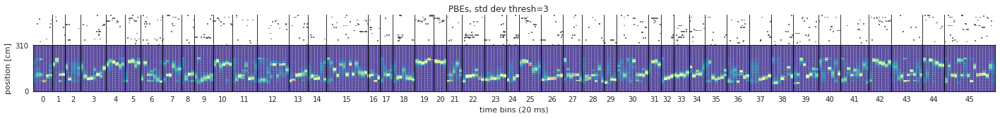

17-29-30 long


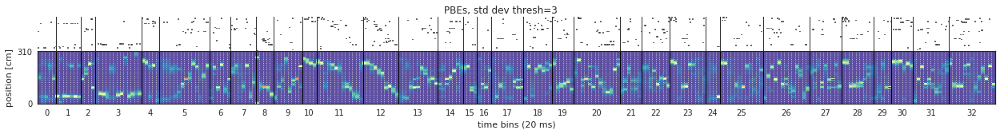

21-16-25 short


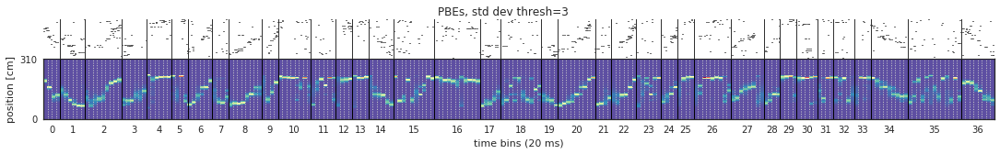

21-16-25 long


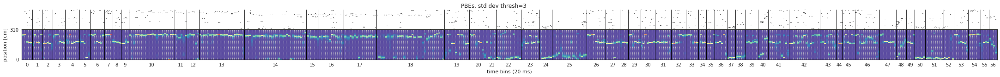

16-53-46 long


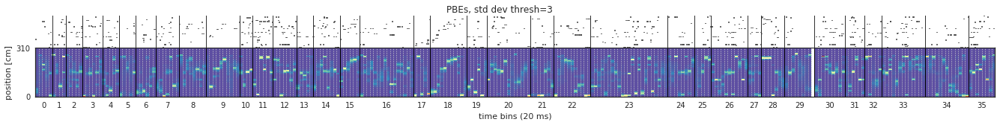

14-28-51 long


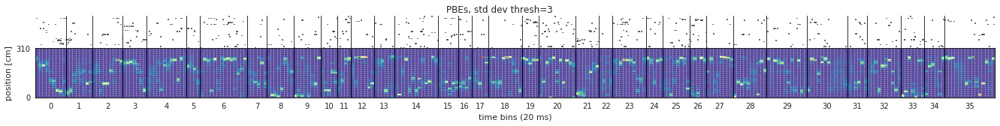

16-40-19 short


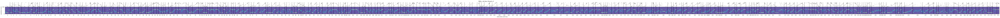

16-40-19 long


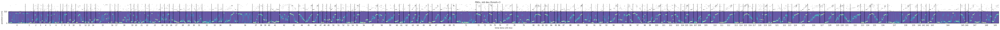

12-52-15 short


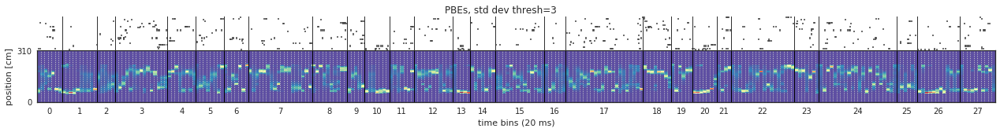

14-42-6 long


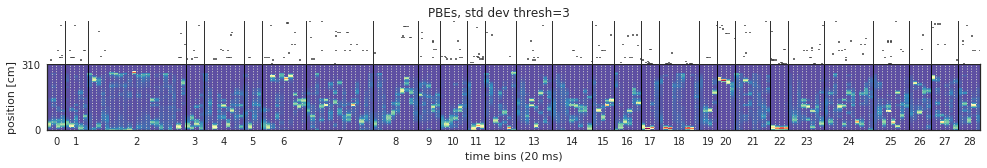

15-12-23 short


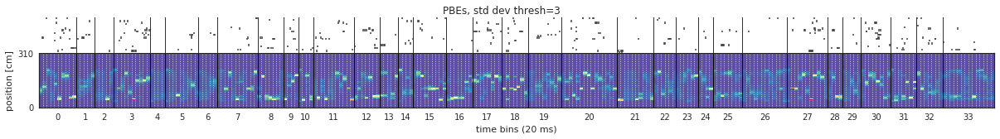

22-24-40 short


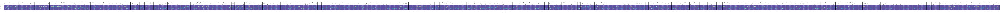

22-24-40 long


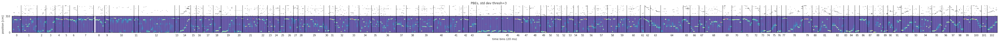

15-55-31 short


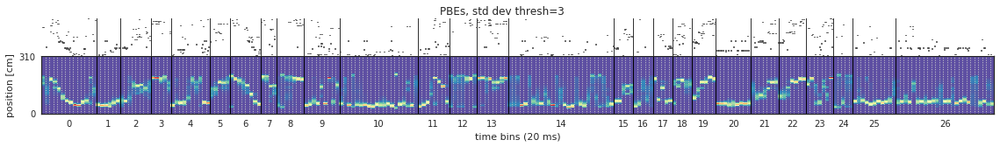

15-55-31 long


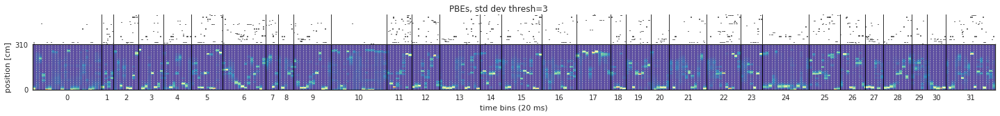

1-22-43 short


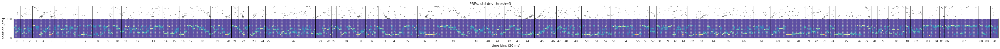

1-22-43 long


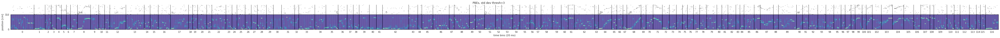

15-22-3 long


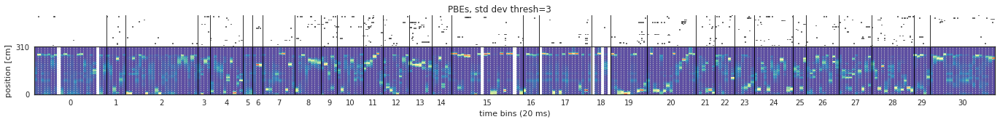

16-40-54 short


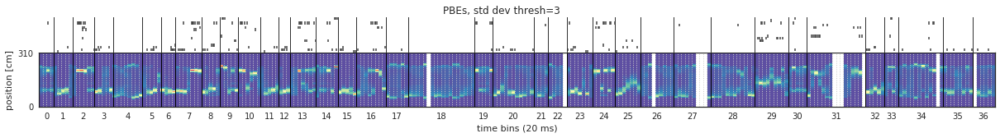

16-40-54 long


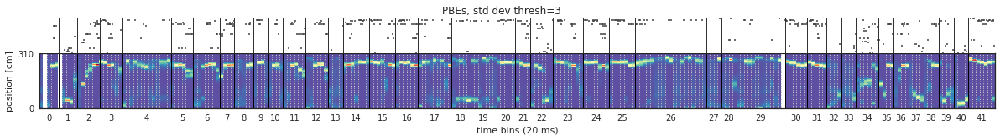

In [47]:
min_n_placecells = 16
min_n_PBEs = 27 # 27 total events ==> minimum 21 events in training set

sessions = df2[(df2.n_PBEs >= min_n_PBEs) & (df2.n_placecells >= min_n_placecells)]['time'].values.tolist()
segments = df2[(df2.n_PBEs >= min_n_PBEs) & (df2.n_placecells >= min_n_placecells)]['segment'].values.tolist()

print('subset of {} sessions'.format(len(sessions)))

for session, segment in zip(sessions, segments):
    print(session, segment)
    bst = aux_data[session][segment]['PBEs']
    st = aux_data[session][segment]['st_placecells']
    tc = aux_data[session][segment]['tc']
    tc_placecells = aux_data[session][segment]['tc_placecells']
    plot_all_PBEs(bst, st, tc, tc_placecells)
    plt.show()

In [80]:
df2.describe()

,month,day,duration,n_cells,n_placecells,n_PBEs,Notes
count,90.000000,90.000000,90.000000,90.000000,90.000000,90.000000,0.0
mean,4.355556,16.377778,443.255556,84.377778,34.544444,47.333333,NaN
std,0.768935,6.304230,263.327521,34.873311,12.588706,53.518452,NaN
min,4.000000,7.000000,170.000000,34.000000,9.000000,1.000000,NaN
25%,4.000000,11.000000,272.750000,67.000000,28.000000,19.000000,NaN
50%,4.000000,16.000000,356.000000,80.000000,34.000000,34.500000,NaN
75%,4.000000,20.500000,502.000000,93.000000,40.000000,55.000000,NaN
max,6.000000,28.000000,1620.000000,203.000000,82.000000,330.000000,NaN


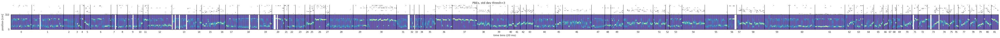

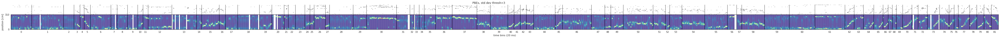

In [118]:
bst = aux_data['19-11-57']['long']['PBEs']
st = aux_data['19-11-57']['short']['st_placecells']
tc = aux_data['19-11-57']['short']['tc']
tc_placecells = aux_data['19-11-57']['short']['tc_placecells']
plot_all_PBEs(bst, st, tc, tc_placecells)
plt.show()
st = aux_data['19-11-57']['long']['st_placecells']
tc = aux_data['19-11-57']['long']['tc']
tc_placecells = aux_data['19-11-57']['long']['tc_placecells']
plot_all_PBEs(bst, st, tc, tc_placecells)
plt.show()


In [18]:
def plot_all_PBEs(bst, spiketrainarray, tuningcurve, tc_placecells, idx=None):

#     bst = aux_data[session][segment]['PBEs']
    if idx is not None:
        bst = bst[idx]
    st = spiketrainarray
    tc = tuningcurve
    tc_placecells = tc_placecells

    no = tc_placecells.get_peak_firing_order_ids()
    st.reorder_units_by_ids(no, inplace=True)

    st_cut = st[bst.support]
    st_cut._support = bst.support # hacky fix so that we can plot events out of order
    st_cut = nel.utils.collapse_time(st_cut)

    # decode neural activity
    posterior, bdries, mode_pth, mean_pth = nel.decoding.decode1D(bst=bst, ratemap=tc, xmax=310)

    with npl.FigureManager(show=True, figsize=(0.08*bst.n_bins,2)) as (fig, ax):
        npl.utils.skip_if_no_output(fig)

        pixel_width = 0.5

        npl.imagesc(x=np.arange(bst.n_bins), y=np.arange(311), data=posterior, cmap=plt.cm.Spectral_r, ax=ax)
        npl.utils.yticks_interval(310)
        npl.utils.no_yticks(ax)
        # plt.imshow(posterior, cmap=plt.cm.Spectral_r, interpolation='none', aspect='auto')
        ax.vlines(np.arange(bst.lengths.sum())-pixel_width, *ax.get_ylim(), lw=1, linestyle=':', color='0.8')
        ax.vlines(np.cumsum(bst.lengths)-pixel_width, *ax.get_ylim(), lw=1)

        ax.set_xlim(-pixel_width, bst.lengths.sum()-pixel_width)

        event_centers = np.insert(np.cumsum(bst.lengths),0,0)
        event_centers = event_centers[:-1] + bst.lengths/2 - 0.5

        ax.set_xticks(event_centers);
        if idx is not None:
            ax.set_xticklabels(idx);
        else:
            ax.set_xticklabels(np.arange(bst.n_epochs));

        npl.utils.no_xticks(ax)

        divider = make_axes_locatable(ax)
        axRaster = divider.append_axes("top", size=0.6, pad=0)

        npl.rasterplot(st_cut, vertstack=True, ax=axRaster, lh=1.25)
        axRaster.set_xlim(st_cut.support.time.squeeze())
        bin_edges = np.linspace(st_cut.support.time[0,0],st_cut.support.time[0,1], bst.n_bins+1)
    #     axRaster.vlines(bin_edges, *ax.get_ylim(), lw=1, linestyle=':', color='0.2')
        axRaster.vlines(bin_edges[np.cumsum(bst.lengths)], *ax.get_ylim(), lw=1, color='0.2')
        npl.utils.no_xticks(axRaster)
        npl.utils.no_xticklabels(axRaster)
        npl.utils.no_yticklabels(axRaster)
        npl.utils.no_yticks(axRaster)
        ax.set_ylabel('position [cm]')
        ax.set_xlabel('time bins (20 ms)')
        fig.suptitle('PBEs, std dev thresh=3')
        npl.utils.clear_left_right(axRaster)
        npl.utils.clear_top_bottom(axRaster)

    #     npl.utils.savefig('PBEs', overwrite=False)

# Look at all decoded events

13-34-40 short


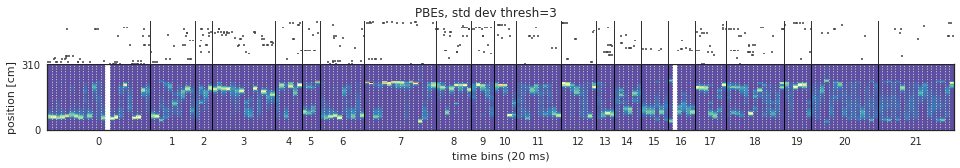

13-34-40 long


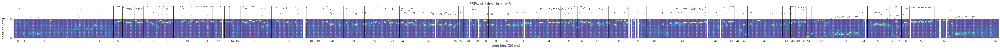

21-16-25 short


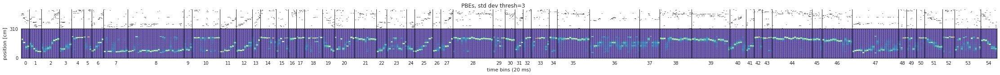

21-16-25 long


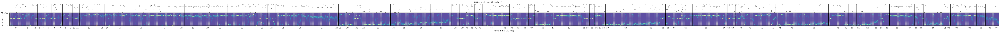

16-37-40 short


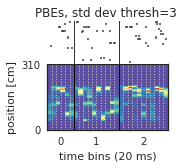

16-37-40 long


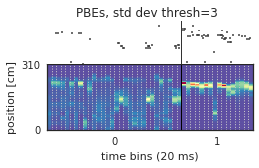

14-43-12 long


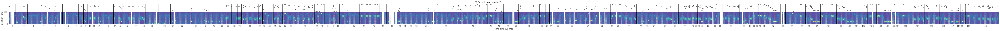

13-6-1 short


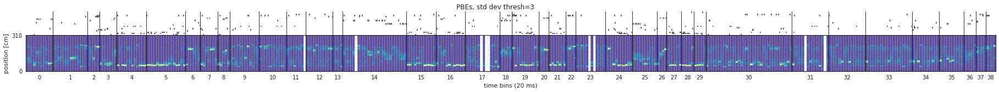

13-6-1 long


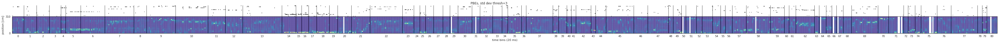

16-48-29 long


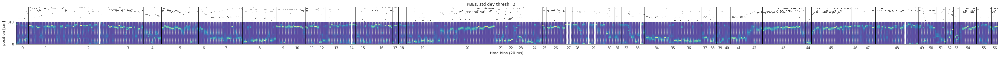

11-19-2 short


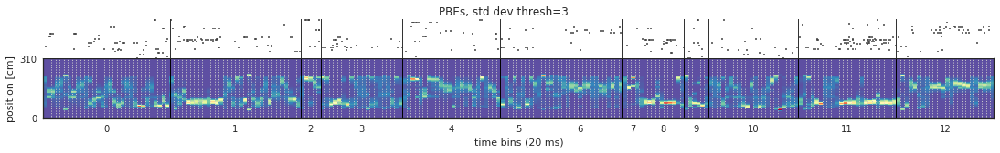

11-19-2 long


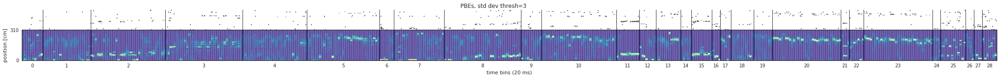

22-24-40 short


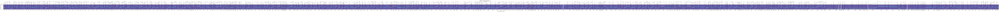

22-24-40 long


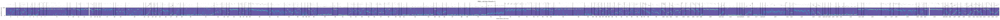

18-47-52 short


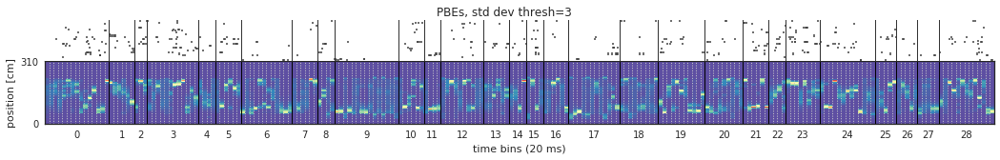

18-47-52 long


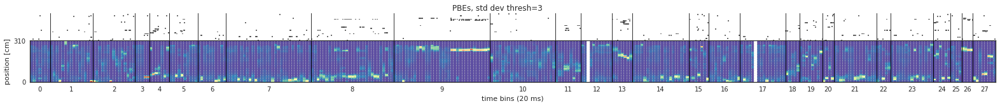

17-6-14 short


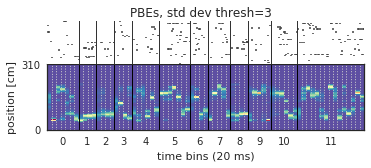

17-6-14 long


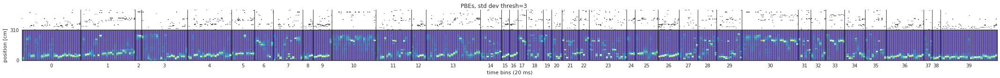

21-2-40 short


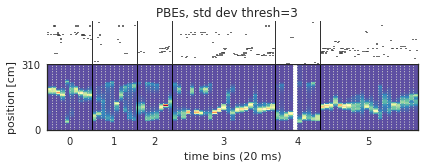

21-2-40 long


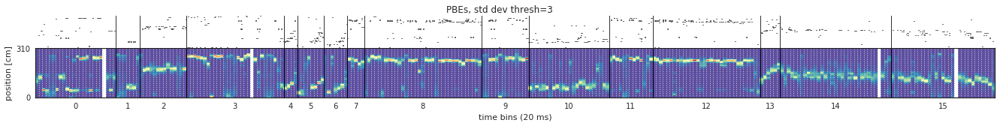

14-42-6 short


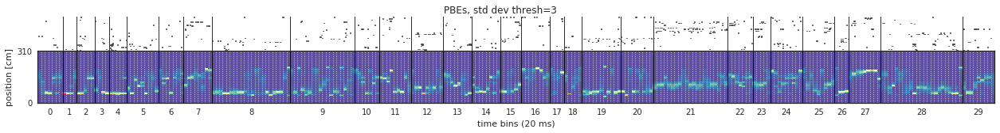

14-42-6 long


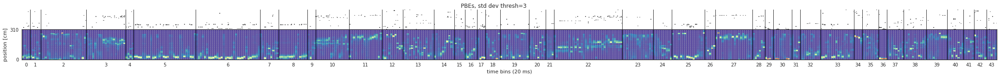

13-50-7 short


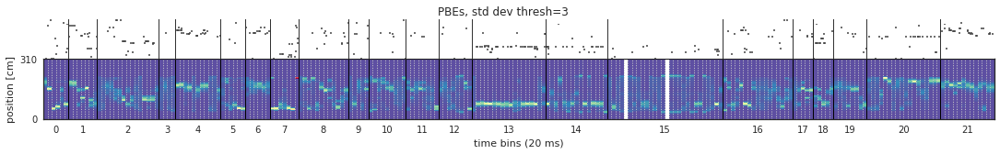

13-50-7 long


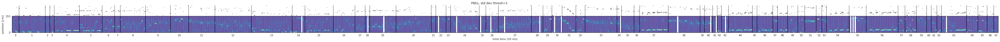

15-23-32 short


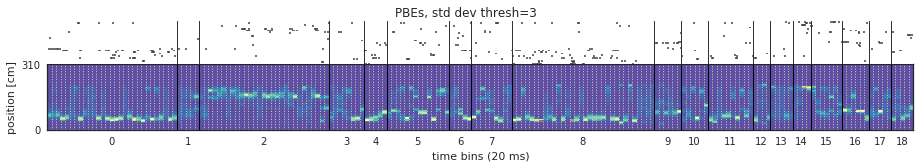

15-23-32 long


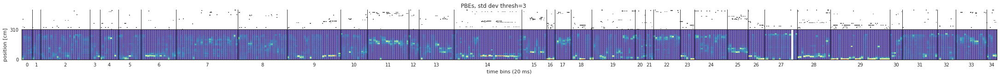

14-28-51 short


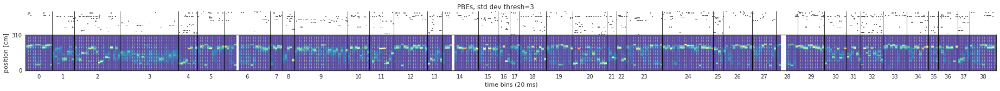

14-28-51 long


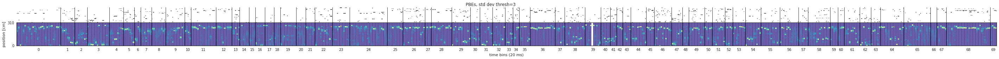

13-51-50 short


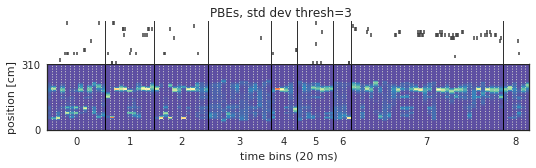

13-51-50 long


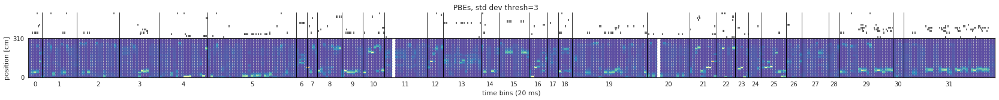

15-38-2 short


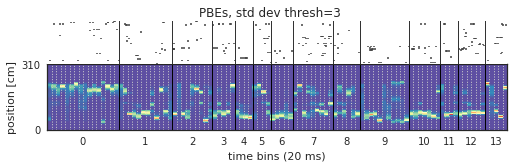

15-38-2 long


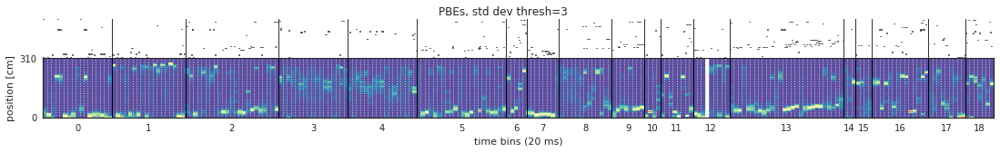

12-25-50 short


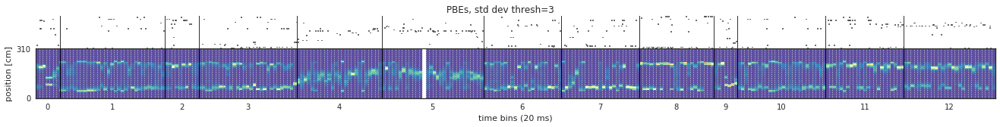

12-25-50 long


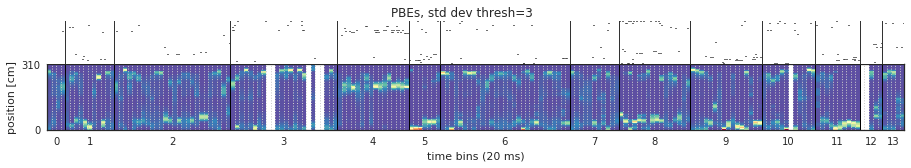

18-21-57 long


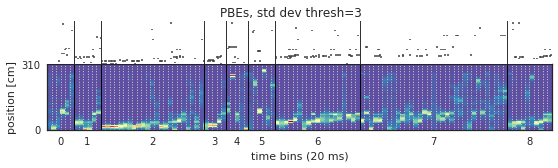

15-16-59 short


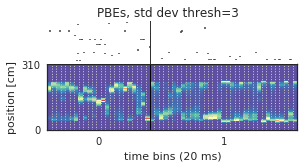

15-16-59 long


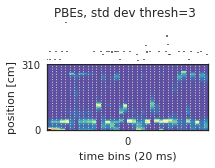

19-11-57 short


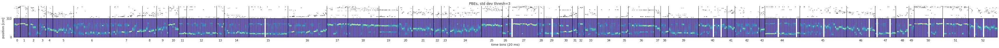

19-11-57 long


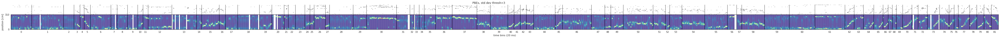

15-25-59 short


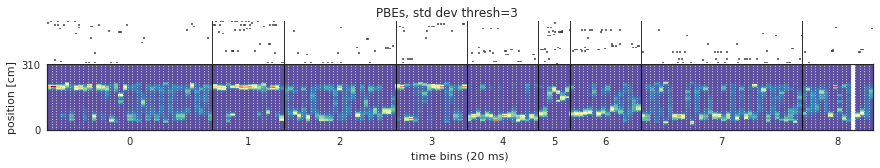

15-25-59 long


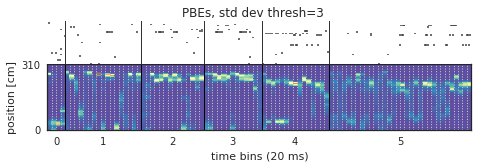

17-29-30 short


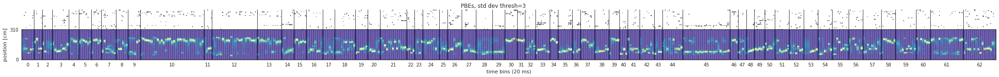

17-29-30 long


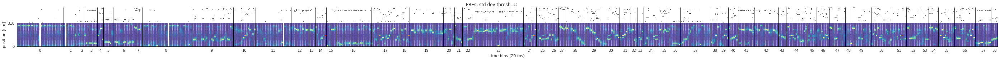

14-49-24 short


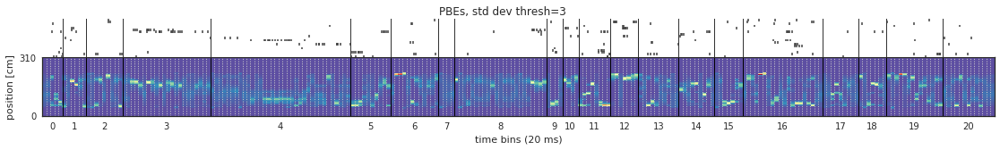

14-49-24 long


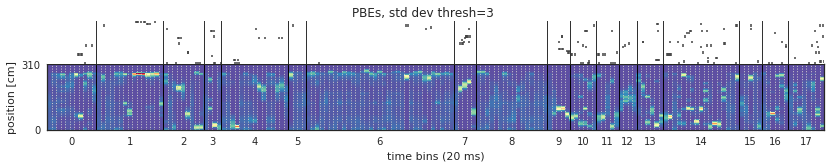

1-22-43 short


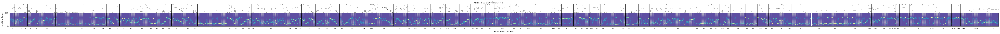

1-22-43 long


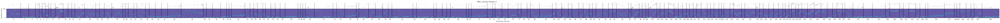

16-2-46 short


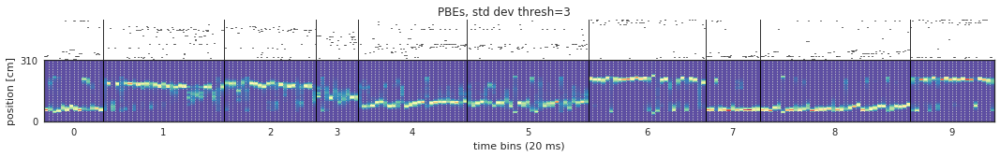

16-2-46 long


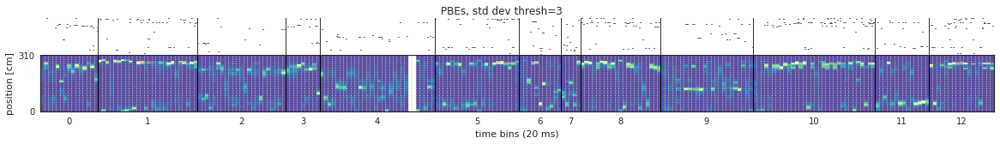

17-53-55 short


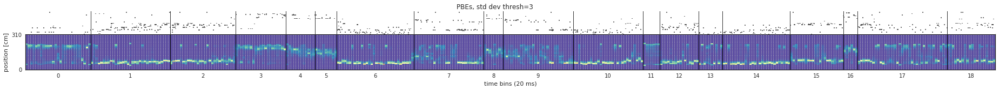

17-53-55 long


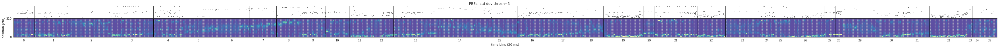

15-55-31 short


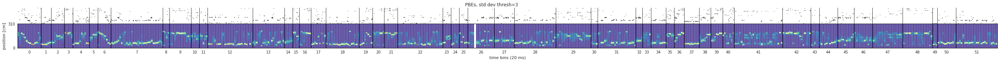

15-55-31 long


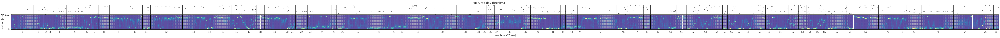

15-12-23 short


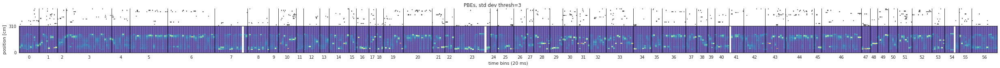

15-12-23 long


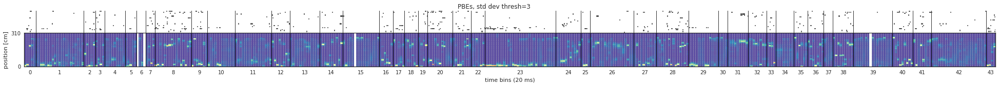

12-33-47 short


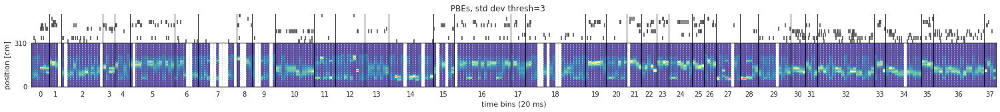

12-33-47 long


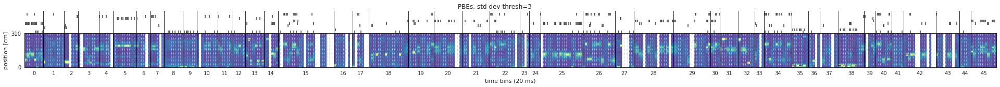

16-48-9 short


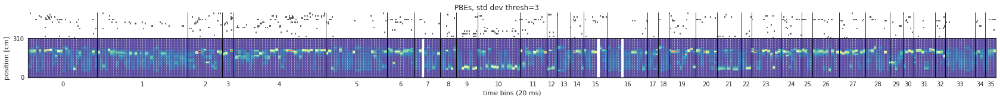

16-48-9 long


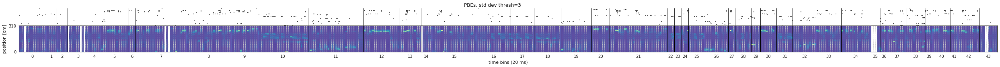

12-58-3 short


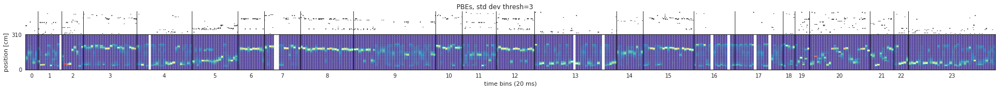

12-58-3 long


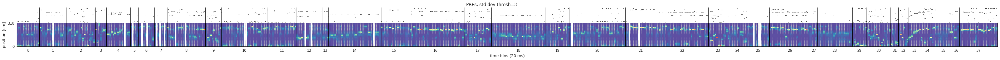

17-17-6 short


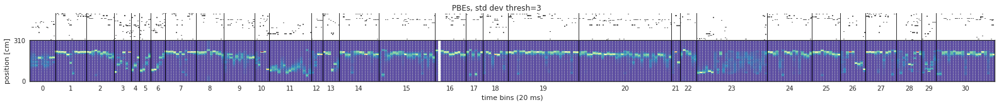

17-17-6 long


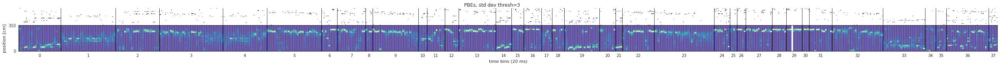

16-40-19 short


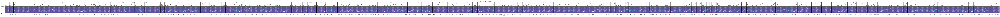

16-40-19 long


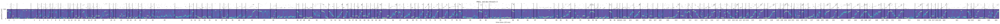

17-33-28 short


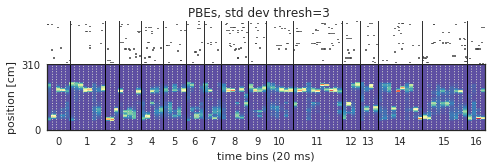

17-33-28 long


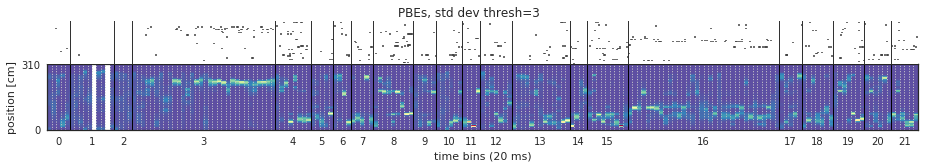

12-48-38 short


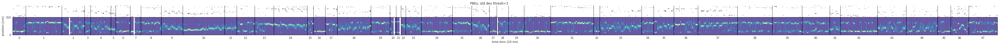

12-48-38 long


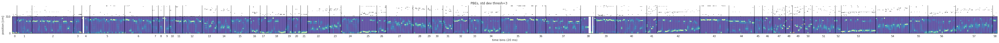

16-53-46 short


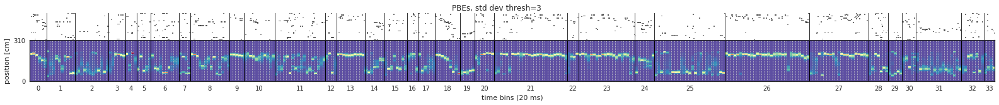

16-53-46 long


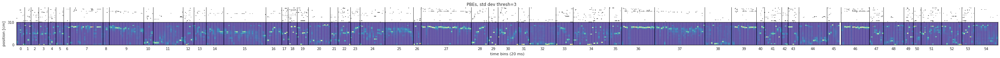

14-59-23 long


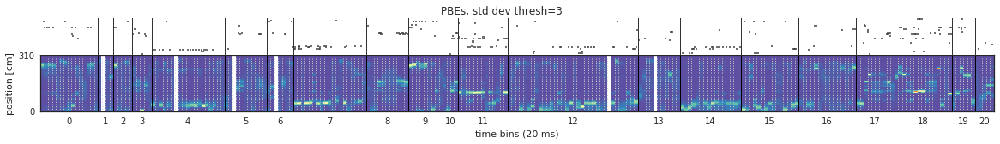

15-22-3 short


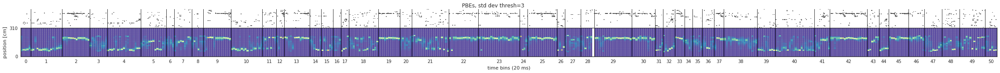

15-22-3 long


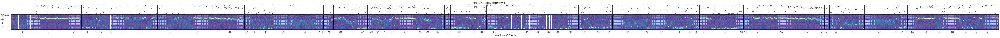

16-40-54 short


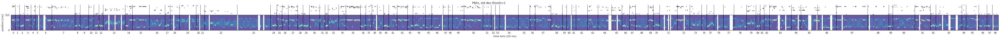

16-40-54 long


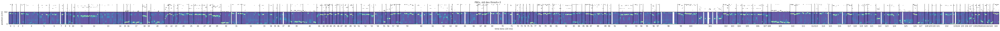

13-28-57 short


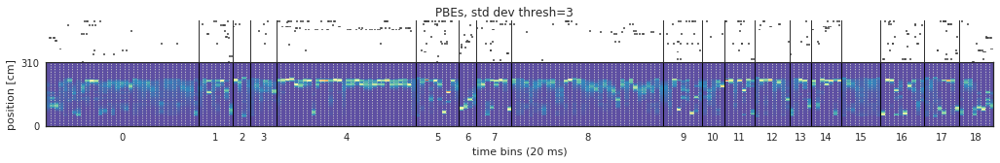

13-28-57 long


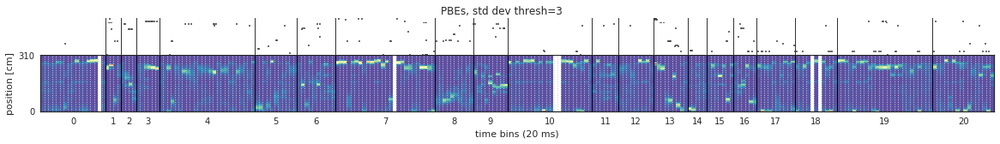

12-38-13 long


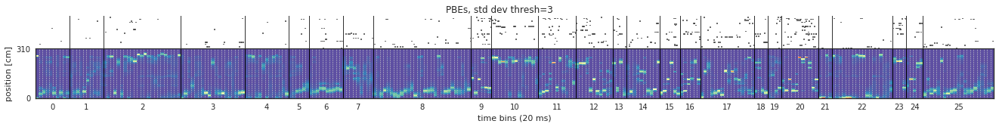

13-22-13 short


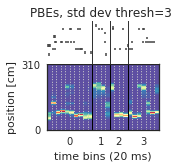

13-22-13 long


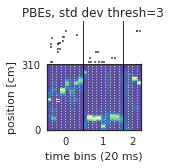

14-39-31 short


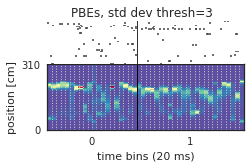

14-39-31 long


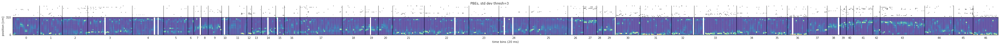

12-17-27 long


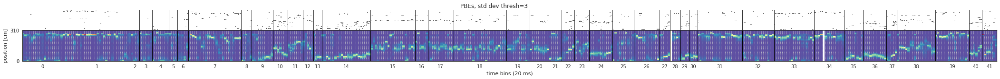

12-52-15 short


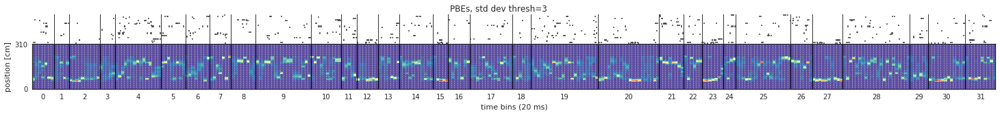

12-52-15 long


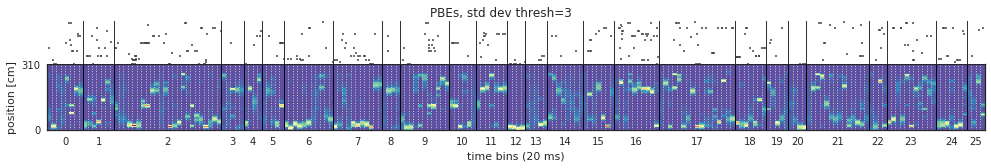

10-24-35 short


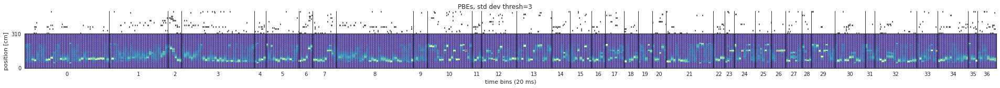

10-24-35 long


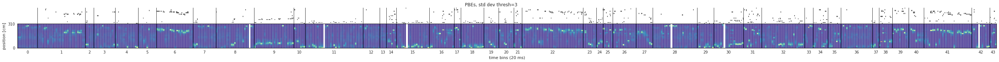

13-20-55 short


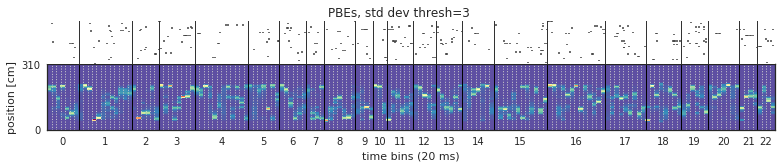

13-20-55 long


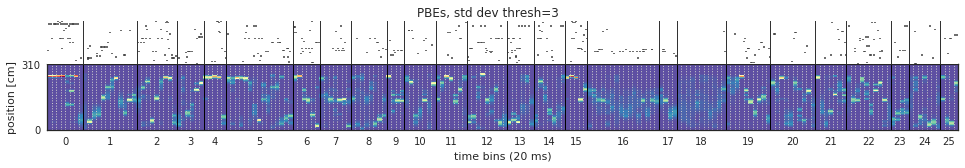

In [97]:
for session in aux_data:
    for segment in aux_data[session]:   
        bst = aux_data[session][segment]['PBEs']
        st = aux_data[session][segment]['st_placecells']
        tc = aux_data[session][segment]['tc']
        tc_placecells = aux_data[session][segment]['tc_placecells']
        print(session, segment)
        plot_all_PBEs(bst, st, tc, tc_placecells)
        plt.show()

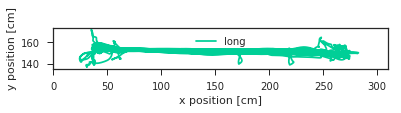

In [150]:
ax = npl.plot2d(exp_data[session]['pos2d'])
ax.set_xlim(0,310)
ax.set_xlabel('x position [cm]')
ax.set_ylabel('y position [cm]')
ax.set_aspect('equal')
ax.legend(('long', 'short'))

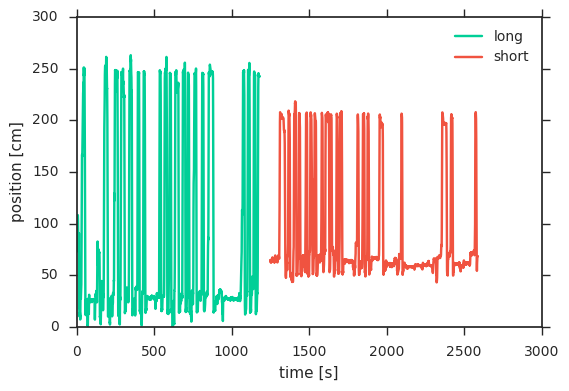

In [23]:
ax = npl.plot(pos)
ax.set_xlabel('time [s]')
ax.set_ylabel('position [cm]')
ax.legend(('long', 'short'))

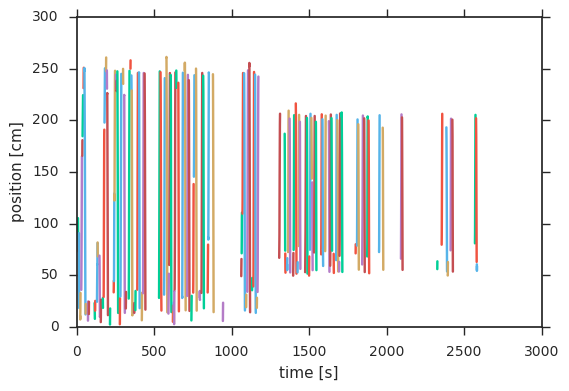

In [24]:
ax = npl.plot(pos[exp_data[session]['run_epochs']])
ax.set_xlabel('time [s]')
ax.set_ylabel('position [cm]')

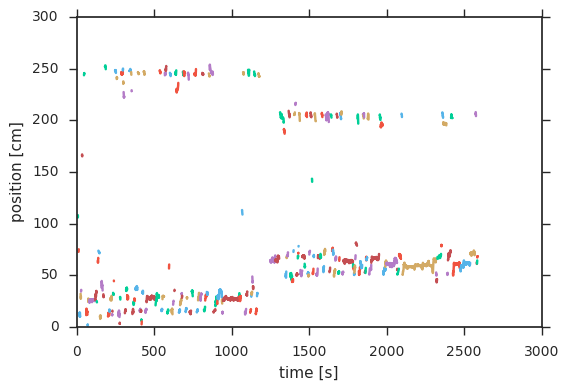

In [25]:
ax = npl.plot(pos[exp_data[session]['rest_epochs']])
ax.set_xlabel('time [s]')
ax.set_ylabel('position [cm]')


Plan of action:
1. compute running velocity
1. determine run and rest epochs
1. compute MUA with unsorted cells, and then remove MUA from spike trains
1. determine PBEs with criteria for min duration, max duration, and min number of active cells
1. train Bayesian decoder on RUN data
1. order spike raster according to peak location on track
1. show estimated place fields, along with virtual place fields (suppl)
1. find PBEs with nice rasters for examples (want 3 examples!)
1. build examples figure with MUA, LFP, ripple-band, running speed, raster, and epoch plot

see both Ting-mua-UTCLM17 (several useful plots, as well as uncurated last plot) and asilomar2017 (raster, and maybe newer)

### We estimate tuning curves, on the long-section only (['spikes'][0])

In [26]:
; Sleep

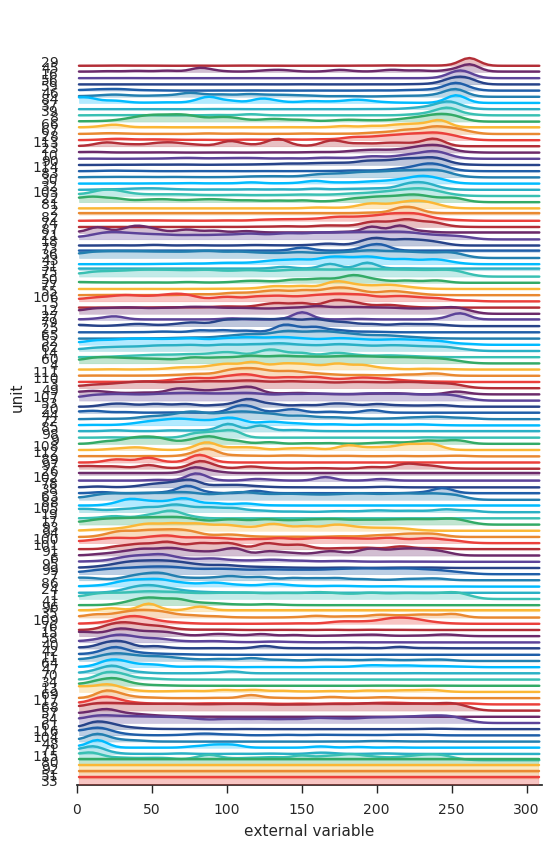

In [27]:
with npl.palettes.color_palette(npl.colors.rainbow):
    with npl.FigureManager(show=True, figsize=(6,10)) as (fig, ax):
        npl.utils.skip_if_no_output(fig)
        npl.plot_tuning_curves1D(tc, ax=ax, normalize=True, pad=0.8);
#         npl.add_simple_scalebar("10 Hz", ax=ax, xy=(10, 25), length=10, orientation='v', rotation_text='h', size=14)

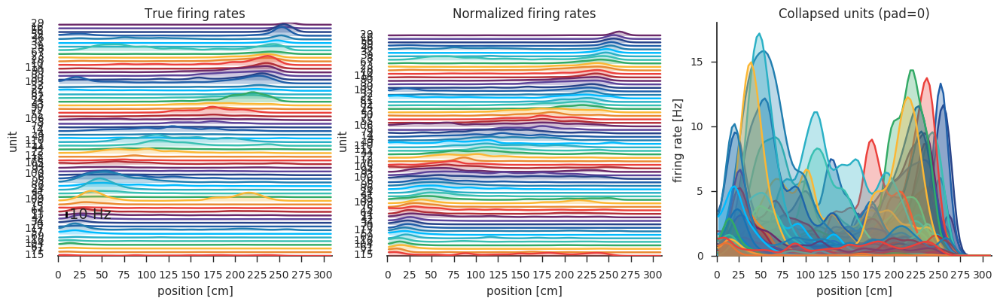

In [28]:
# set criteria for units used in decoding
min_peakfiringrate = 1 # Hz
max_avgfiringrate = 5 # Hz
peak_to_mean_ratio_threshold = 0 # peak firing rate should be greater than 3.5 times mean firing rate

# unimodal_cells = find_unimodal_tuningcurves1D(smoothed_rate, peakthresh=0.5)

# enforce minimum peak firing rate
unit_ids_to_keep = set(np.asanyarray(tc.unit_ids)[np.argwhere(tc.ratemap.max(axis=1)>min_peakfiringrate).squeeze().tolist()])
# enforce maximum average firing rate
unit_ids_to_keep = unit_ids_to_keep.intersection(set( np.asanyarray(tc.unit_ids)[np.argwhere(tc.ratemap.mean(axis=1)<max_avgfiringrate).squeeze().tolist()]   ))

# enforce peak to mean firing ratio
peak_firing_rates = tc.max(axis=1)
mean_firing_rates = tc.mean(axis=1)
ratio = peak_firing_rates/mean_firing_rates
unit_ids_to_keep = unit_ids_to_keep.intersection(set(np.asanyarray(tc.unit_ids)[np.argwhere(ratio>=peak_to_mean_ratio_threshold).squeeze().tolist()]))

# finally, convert remaining units into a list of indices
unit_ids_to_keep = list(unit_ids_to_keep)

# modify spike trains and ratemap to only include those units that passed all the criteria
sta_placecells = exp_data[session]['spikes']._unit_subset(unit_ids_to_keep)

tc_placecells = tc._unit_subset(unit_ids_to_keep)

# reorder cells by peak firing location on track (this is nice for visualization, but doesn't affect decoding)
tc_placecells.reorder_units(inplace=True)

sta_placecells.reorder_units_by_ids(tc_placecells.unit_ids, inplace=True)

# with plt.xkcd():
with npl.palettes.color_palette(npl.colors.rainbow):
    with npl.FigureManager(show=True, nrows=1, ncols=3, figsize=(16,4)) as (fig, axes):
        npl.utils.skip_if_no_output(fig)
        ax0, ax1, ax2 = axes

        npl.plot_tuning_curves1D(tc_placecells.smooth(sigma=3), ax=ax0, pad=5.5);
        npl.plot_tuning_curves1D(tc_placecells.smooth(sigma=3), ax=ax1, normalize=True, pad=0.9);
        npl.plot_tuning_curves1D(tc_placecells.smooth(sigma=3), ax=ax2, pad=0);

        for ax in axes:
            ax.set_xlabel('position [cm]')
        npl.utils.xticks_interval(25, *axes)
        npl.utils.yticks_interval(5, ax2)
        npl.add_simple_scalebar("10 Hz", ax=ax0, xy=(10, 57), length=10, orientation='v', rotation_text='h', size=14)
#         npl.add_simple_scalebar("5 Hz", ax=ax1, xy=(10, 17.5), length=5, orientation='v', rotation_text='h', size=14)
        ax0.set_title('True firing rates', size=12)
        ax1.set_title('Normalized firing rates', size=12)
        ax2.set_title('Collapsed units (pad=0)', size=12)

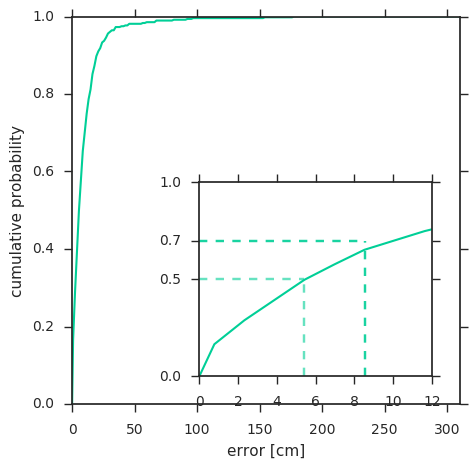

In [29]:
with npl.FigureManager(show=True, figsize=(5,5)) as (fig, ax):
    npl.utils.skip_if_no_output(fig)
    
    ds_run = 0.5 # 100 ms
    ds_1ms = 0.01
    st_run_ = sta_placecells[0][exp_data[session]['run_epochs']]

    # smooth and re-bin:
    bst_run = st_run_.bin(ds=ds_1ms).smooth(sigma=0.5, inplace=True).rebin(w=ds_run/ds_1ms)
    
    bst = bst_run

    cumhist, bincenters = nel.decoding.cumulative_dist_decoding_error_using_xval(bst, extern=exp_data[session]['pos1d'], extmax=310)
    npl.plot_cum_error_dist(bst=bst, extern=exp_data[session]['pos1d'], extmin=0, extmax=310);

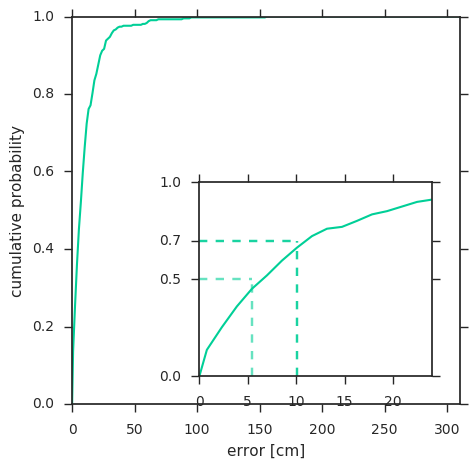

In [30]:
with npl.FigureManager(show=True, figsize=(5,5)) as (fig, ax):
    npl.utils.skip_if_no_output(fig)
    
    ds_run = 0.5 # 100 ms
    ds_1ms = 0.01
#     st_run = st[run_epochs]

    # smooth and re-bin:
    bst_run = st_run.bin(ds=ds_1ms).smooth(sigma=0.5, inplace=True).rebin(w=ds_run/ds_1ms)
    
    bst = bst_run

    cumhist, bincenters = nel.decoding.cumulative_dist_decoding_error_using_xval(bst, extern=exp_data[session]['pos1d'], extmax=310)
    npl.plot_cum_error_dist(bst=bst, extern=exp_data[session]['pos1d'], extmin=0, extmax=310);

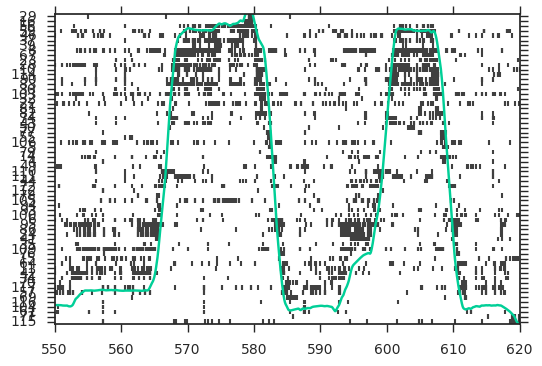

In [32]:
ax = npl.rasterplot(sta_placecells, vertstack=True)
ax.set_xlim(550, 620)
npl.plot(pos/4, ax=ax)

## PBE decoding

In [33]:
ds_20ms = 0.02

# for long segment only, use ['spikes'][0]
muaspks = exp_data[session]['spikes'][0][exp_data[session]['mua_epochs']]

sigma = 0
bst = muaspks.bin(ds=0.01).smooth(sigma=sigma).rebin(w=2)

# limit PBEs to those with at least four active cells per event
PBEidx = np.argwhere(np.asanyarray([bb.n_active for bb in bst])>=min_cells_active).squeeze()
PBEs = bst[PBEidx]
print(PBEs)

# decode neural activity
posterior, bdries, mode_pth, mean_pth = nel.decoding.decode1D(bst=PBEs, ratemap=tc, xmax=310)

<BinnedSpikeTrainArray at 0x7fd3b04fd4e0: 117 units (167 segments) in 1,496 bins of width 20.0 milliseconds> for a total of 29.92 seconds


(<matplotlib.axes._subplots.AxesSubplot at 0x7fd3b30532e8>,
 <matplotlib.image.AxesImage at 0x7fd3b053a748>)

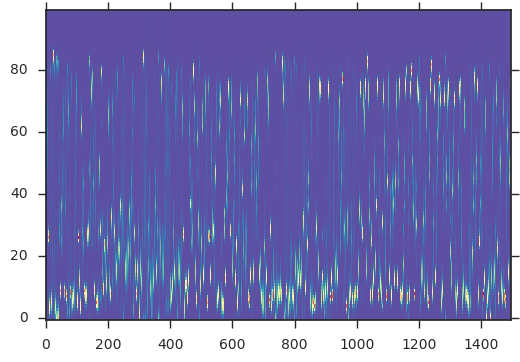

In [34]:
npl.imagesc(posterior, cmap=plt.cm.Spectral_r)

In [35]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

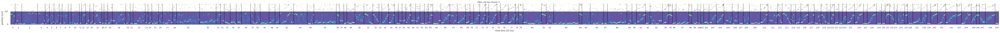

In [36]:
bst = PBEs[:150]

st = sta_placecells

no = tc_placecells.get_peak_firing_order_ids()
st.reorder_units_by_ids(no, inplace=True)

st_cut = st[bst.support]
st_cut = nel.utils.collapse_time(st_cut)

# decode neural activity
posterior, bdries, mode_pth, mean_pth = nel.decoding.decode1D(bst=bst, ratemap=tc, xmax=310)

with npl.FigureManager(show=True, figsize=(92,2)) as (fig, ax):
    npl.utils.skip_if_no_output(fig)
    
    pixel_width = 0.5

    npl.imagesc(x=np.arange(bst.n_bins), y=np.arange(311), data=posterior, cmap=plt.cm.Spectral_r, ax=ax)
    npl.utils.yticks_interval(310)
    npl.utils.no_yticks(ax)
    # plt.imshow(posterior, cmap=plt.cm.Spectral_r, interpolation='none', aspect='auto')
    ax.vlines(np.arange(bst.lengths.sum())-pixel_width, *ax.get_ylim(), lw=1, linestyle=':', color='0.8')
    ax.vlines(np.cumsum(bst.lengths)-pixel_width, *ax.get_ylim(), lw=1)

    ax.set_xlim(-pixel_width, bst.lengths.sum()-pixel_width)
    
    event_centers = np.insert(np.cumsum(bst.lengths),0,0)
    event_centers = event_centers[:-1] + bst.lengths/2 - 0.5
    
    ax.set_xticks(event_centers);
    ax.set_xticklabels(np.arange(bst.n_epochs));
    
    
#     ax.set_xticks(np.cumsum(bst.lengths)-pixel_width);
#     ax.set_xticklabels(np.cumsum(bst.lengths));
    
    npl.utils.no_xticks(ax)
    
    divider = make_axes_locatable(ax)
    axRaster = divider.append_axes("top", size=0.6, pad=0)
    
    npl.rasterplot(st_cut, vertstack=True, ax=axRaster, lh=1.25)
    axRaster.set_xlim(st_cut.support.time.squeeze())
    bin_edges = np.linspace(st_cut.support.time[0,0],st_cut.support.time[0,1], bst.n_bins+1)
#     axRaster.vlines(bin_edges, *ax.get_ylim(), lw=1, linestyle=':', color='0.2')
    axRaster.vlines(bin_edges[np.cumsum(bst.lengths)], *ax.get_ylim(), lw=1, color='0.2')
    npl.utils.no_xticks(axRaster)
    npl.utils.no_xticklabels(axRaster)
    npl.utils.no_yticklabels(axRaster)
    npl.utils.no_yticks(axRaster)
    ax.set_ylabel('position [cm]')
    ax.set_xlabel('time bins (20 ms)')
    fig.suptitle('PBEs, std dev thresh=3')
    npl.utils.clear_left_right(axRaster)
    npl.utils.clear_top_bottom(axRaster)
    
#     npl.utils.savefig('PBEs', overwrite=False)

In [ ]:
# '16-40-19', short segment, PBEs 35 84 96(FB!) 127 128 136(NB!) 148; long segment: 104

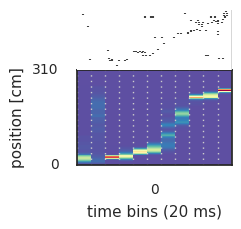

In [37]:
bst = PBEs[141]

no = tc_placecells.get_peak_firing_order_ids()
st.reorder_units_by_ids(no, inplace=True)

st_cut = st[bst.support]
st_cut = nel.utils.collapse_time(st_cut)

# decode neural activity
posterior, bdries, mode_pth, mean_pth = nel.decoding.decode1D(bst=bst, ratemap=tc, xmax=310)

with npl.FigureManager(show=True, figsize=(2,2)) as (fig, ax):
    npl.utils.skip_if_no_output(fig)
    
    pixel_width = 0.5

    npl.imagesc(x=np.arange(bst.n_bins), y=np.arange(311), data=posterior, cmap=plt.cm.Spectral_r, ax=ax)
    npl.utils.yticks_interval(310)
    npl.utils.no_yticks(ax)
    # plt.imshow(posterior, cmap=plt.cm.Spectral_r, interpolation='none', aspect='auto')
    ax.vlines(np.arange(bst.lengths.sum())-pixel_width, *ax.get_ylim(), lw=1, linestyle=':', color='0.8')
    ax.vlines(np.cumsum(bst.lengths)-pixel_width, *ax.get_ylim(), lw=1)

    ax.set_xlim(-pixel_width, bst.lengths.sum()-pixel_width)
    
    event_centers = np.insert(np.cumsum(bst.lengths),0,0)
    event_centers = event_centers[:-1] + bst.lengths/2 - 0.5
    
    ax.set_xticks(event_centers);
    ax.set_xticklabels(np.arange(bst.n_epochs));
    
    
#     ax.set_xticks(np.cumsum(bst.lengths)-pixel_width);
#     ax.set_xticklabels(np.cumsum(bst.lengths));
    
    npl.utils.no_xticks(ax)
    
    divider = make_axes_locatable(ax)
    axRaster = divider.append_axes("top", size=0.6, pad=0)
    
    npl.rasterplot(st_cut, vertstack=True, ax=axRaster, lh=1.25)
    axRaster.set_xlim(st_cut.support.time.squeeze())
    bin_edges = np.linspace(st_cut.support.time[0,0],st_cut.support.time[0,1], bst.n_bins+1)
#     axRaster.vlines(bin_edges, *ax.get_ylim(), lw=1, linestyle=':', color='0.2')
    axRaster.vlines(bin_edges[np.cumsum(bst.lengths)], *ax.get_ylim(), lw=1, color='0.2')
    npl.utils.no_xticks(axRaster)
    npl.utils.no_xticklabels(axRaster)
    npl.utils.no_yticklabels(axRaster)
    npl.utils.no_yticks(axRaster)
    ax.set_ylabel('position [cm]')
    ax.set_xlabel('time bins (20 ms)')
#     fig.suptitle('PBEs, std dev thresh=3')
    npl.utils.clear_left_right(axRaster)
    npl.utils.clear_top_bottom(axRaster)
    
#     npl.utils.savefig('PBEs', overwrite=False)

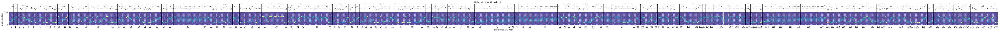

In [101]:
bst = PBEs[:150]

st = exp_data[session]['spikes'][0]

no = tc.get_peak_firing_order_ids()
st.reorder_units_by_ids(no, inplace=True)

st_cut = st[bst.support]
st_cut = nel.utils.collapse_time(st_cut)

# decode neural activity
posterior, bdries, mode_pth, mean_pth = nel.decoding.decode1D(bst=bst, ratemap=tc, xmax=310)

with npl.FigureManager(show=True, figsize=(92,2)) as (fig, ax):
    npl.utils.skip_if_no_output(fig)
    
    pixel_width = 0.5

    npl.imagesc(x=np.arange(bst.n_bins), y=np.arange(311), data=posterior, cmap=plt.cm.Spectral_r, ax=ax)
    npl.utils.yticks_interval(310)
    npl.utils.no_yticks(ax)
    # plt.imshow(posterior, cmap=plt.cm.Spectral_r, interpolation='none', aspect='auto')
    ax.vlines(np.arange(bst.lengths.sum())-pixel_width, *ax.get_ylim(), lw=1, linestyle=':', color='0.8')
    ax.vlines(np.cumsum(bst.lengths)-pixel_width, *ax.get_ylim(), lw=1)

    ax.set_xlim(-pixel_width, bst.lengths.sum()-pixel_width)
    
    event_centers = np.insert(np.cumsum(bst.lengths),0,0)
    event_centers = event_centers[:-1] + bst.lengths/2 - 0.5
    
    ax.set_xticks(event_centers);
    ax.set_xticklabels(np.arange(bst.n_epochs));
    
    
#     ax.set_xticks(np.cumsum(bst.lengths)-pixel_width);
#     ax.set_xticklabels(np.cumsum(bst.lengths));
    
    npl.utils.no_xticks(ax)
    
    divider = make_axes_locatable(ax)
    axRaster = divider.append_axes("top", size=0.6, pad=0)
    
    npl.rasterplot(st_cut, vertstack=True, ax=axRaster, lh=1.25)
    axRaster.set_xlim(st_cut.support.time.squeeze())
    bin_edges = np.linspace(st_cut.support.time[0,0],st_cut.support.time[0,1], bst.n_bins+1)
#     axRaster.vlines(bin_edges, *ax.get_ylim(), lw=1, linestyle=':', color='0.2')
    axRaster.vlines(bin_edges[np.cumsum(bst.lengths)], *ax.get_ylim(), lw=1, color='0.2')
    npl.utils.no_xticks(axRaster)
    npl.utils.no_xticklabels(axRaster)
    npl.utils.no_yticklabels(axRaster)
    npl.utils.no_yticks(axRaster)
    ax.set_ylabel('position [cm]')
    ax.set_xlabel('time bins (20 ms)')
    fig.suptitle('PBEs, std dev thresh=3')
    npl.utils.clear_left_right(axRaster)
    npl.utils.clear_top_bottom(axRaster)
    
#     npl.utils.savefig('PBEs', overwrite=False)

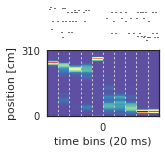

In [82]:
bst = PBEs[104]

no = tc.get_peak_firing_order_ids()
st.reorder_units_by_ids(no, inplace=True)

st_cut = st[bst.support]
st_cut = nel.utils.collapse_time(st_cut)

# decode neural activity
posterior, bdries, mode_pth, mean_pth = nel.decoding.decode1D(bst=bst, ratemap=tc, xmax=310)

with npl.FigureManager(show=True, figsize=(2,2)) as (fig, ax):
    npl.utils.skip_if_no_output(fig)
    
    pixel_width = 0.5

    npl.imagesc(x=np.arange(bst.n_bins), y=np.arange(311), data=posterior, cmap=plt.cm.Spectral_r, ax=ax)
    npl.utils.yticks_interval(310)
    npl.utils.no_yticks(ax)
    # plt.imshow(posterior, cmap=plt.cm.Spectral_r, interpolation='none', aspect='auto')
    ax.vlines(np.arange(bst.lengths.sum())-pixel_width, *ax.get_ylim(), lw=1, linestyle=':', color='0.8')
    ax.vlines(np.cumsum(bst.lengths)-pixel_width, *ax.get_ylim(), lw=1)

    ax.set_xlim(-pixel_width, bst.lengths.sum()-pixel_width)
    
    event_centers = np.insert(np.cumsum(bst.lengths),0,0)
    event_centers = event_centers[:-1] + bst.lengths/2 - 0.5
    
    ax.set_xticks(event_centers);
    ax.set_xticklabels(np.arange(bst.n_epochs));
    
    
#     ax.set_xticks(np.cumsum(bst.lengths)-pixel_width);
#     ax.set_xticklabels(np.cumsum(bst.lengths));
    
    npl.utils.no_xticks(ax)
    
    divider = make_axes_locatable(ax)
    axRaster = divider.append_axes("top", size=0.6, pad=0)
    
    npl.rasterplot(st_cut, vertstack=True, ax=axRaster, lh=1.25)
    axRaster.set_xlim(st_cut.support.time.squeeze())
    bin_edges = np.linspace(st_cut.support.time[0,0],st_cut.support.time[0,1], bst.n_bins+1)
#     axRaster.vlines(bin_edges, *ax.get_ylim(), lw=1, linestyle=':', color='0.2')
    axRaster.vlines(bin_edges[np.cumsum(bst.lengths)], *ax.get_ylim(), lw=1, color='0.2')
    npl.utils.no_xticks(axRaster)
    npl.utils.no_xticklabels(axRaster)
    npl.utils.no_yticklabels(axRaster)
    npl.utils.no_yticks(axRaster)
    ax.set_ylabel('position [cm]')
    ax.set_xlabel('time bins (20 ms)')
#     fig.suptitle('PBEs, std dev thresh=3')
    npl.utils.clear_left_right(axRaster)
    npl.utils.clear_top_bottom(axRaster)
    
#     npl.utils.savefig('PBEs', overwrite=False)

# UNCURATED BELOW THIS POINT

In [10]:
# approach 1 to calculating periods of inactivity / immobility: direct calculation
v1 = 3  # 2 ==> 5 cm/s; 3 ==> 7.5 cm/s
v2 = 3  # 2 ==> 5 cm/s; 3 ==> 7.5 cm/s

# compute periods of inactivity (< 5 cm/s)
INACTIVE_bounds, _, _ = nel.utils.get_events_boundaries(
    exp_data[session]['posdf'].speed,
    PrimaryThreshold=v1,   # 2 ==> 5 cm/s
    SecondaryThreshold=v2, # 2 ==> 5 cm/s; 3 ==> 7.5 cm/s
    mode='below'
)

# convert bounds to time in seconds
INACTIVE_bounds = INACTIVE_bounds / exp_data[session]['posdf'].fps[0]
# create EpochArray with inactive bounds
inactive_epochs = nel.EpochArray(INACTIVE_bounds, fs=1)

# compute periods of activity (sustained running of > 20 cm /s and peak velocity of at least 25 cm/s)
RUN_bounds, _, _ = nel.utils.get_events_boundaries(
    exp_data[session]['posdf'].speed,
    PrimaryThreshold=10,  # 10 ==> 25 cm/s
    SecondaryThreshold=8  # 8  ==> 20 cm/s
)

# convert bounds to time in seconds
RUN_bounds = RUN_bounds / exp_data[session]['posdf'].fps[0]
# create EpochArray with running bounds
run_epochs = nel.EpochArray(RUN_bounds, fs=1)

# display quick summary of run and inactive events
print("running: ", run_epochs)
print("inactive:", inactive_epochs)

running:  <EpochArray at 0x7efce4469710: 77 epochs> of duration 3:19:500 minutes
inactive: <EpochArray at 0x7efce4469390: 175 epochs> of duration 11:05:417 minutes


## MUA-based event detection

In [11]:
# TODO: modify spike smoothing to make use of st._bin() with gaussian window

# collapse spike trains across all units
mua_spks = exp_data[session]['spikes'].flatten(unit_label='mua')

# bin spikes into 1 ms bins, so that we can smooth the spike times
ds_1ms = 0.001  # bin width of 1 ms
mua_binned = mua_spks.bin(ds=ds_1ms)

# bin spikes into 1 ms bins, so that we can smooth the spike times
ds_1ms = 0.001  # bin width of 1 ms
mua_binned = mua_spks.bin(ds=ds_1ms)

# smooth MUA spike train (this is our estimated mua firing 'rate')
sigma = 0.010 / ds_1ms # 10 ms standard deviation
bw = 6 # bandwidth of filter (outside of this bandwidth, the filter is zero)
smoothed_spikes = scipy.ndimage.filters.gaussian_filter1d(np.squeeze(mua_binned.data.astype(float)), 
                                                          sigma=sigma, truncate=bw)

# store MUA firing 'rate' in an AnalogSignalArray
mua = nel.AnalogSignalArray(smoothed_spikes, tdata=mua_binned.centers, step=0.001)

# determine MUA event bounds:
mua_bounds_idx, maxes, _ = nel.utils.get_events_boundaries(
    x = mua.ydata,
    PrimaryThreshold = mua.mean() + 3*mua.std(),
    SecondaryThreshold = mua.mean(),
    minLength = 0.07, # 70 ms
    maxLength = 0.5,  # 500 ms
    ds = mua_binned.ds
)

if len(mua_bounds_idx) == 0:
    raise ValueError("no mua events detected")

# store MUA bounds in an EpochArray
mua_epochs = nel.EpochArray(mua.time[mua_bounds_idx], fs=1)
print('mua epochs BEFORE speed restriction:', mua_epochs)

# APPROACH 1: restrict MUA events to where the animal was running less than x units/sec
mua_epochs_speedA = mua_epochs[inactive_epochs]

# APPROACH 2: to calculating periods of inactivity: compute average speed during each mua event:
# create new AnalogSignalArray containing speed, so that we can find events during immobility
speed = nel.AnalogSignalArray(ydata=exp_data[session]['posdf']['speed'].values, 
                              tdata=exp_data[session]['posdf'].time.values, step=1/60)
avg_speeds = np.array([event.mean() for event in speed[mua_epochs]])
mua_idx, = np.where(avg_speeds < v1)
mua_epochs_speedB = mua_epochs[mua_idx]

# extract spike sequences associated to speed restricted mua events
mua_st = exp_data[session]['spikes'][mua_epochs_speedB]

# throw away unit 0 that corresponded to unsortable spikes
mua_st = mua_st._unit_subset(np.arange(1,mua_st.n_units))

# set mua_epochs equal to speed restricted mua events
mua_epochs = mua_epochs_speedB

print("mua epochs after using aproach A:", mua_epochs_speedA)
print("mua epochs after using aproach B:", mua_epochs_speedB)

mua epochs BEFORE speed restriction: <EpochArray at 0x7efce4486828: 221 epochs> of duration 43.841 seconds
mua epochs after using aproach A: <EpochArray at 0x7efce4486748: 97 epochs> of duration 15.436 seconds
mua epochs after using aproach B: <EpochArray at 0x7efce4486c50: 89 epochs> of duration 15.31 seconds


**Conclusion:** both approaches are almost identical, but average speed is probably what is used more in literature; besides, Approach 2 guarantees previously set min and max durations

### Assign events to either train or test sets

In [12]:
trainidx, testidx = train_test_split(np.arange(mua_epochs[which_half].n_epochs), test_size=0.4, random_state=1)

trainidx.sort()
testidx.sort()

mua_epochs_train = mua_epochs[trainidx]
mua_epochs_test = mua_epochs[testidx]

print('{} train mua events and {} test mua events'.format(len(trainidx),len(testidx)))

32 train mua events and 22 test mua events


# Train HMM on mua events 

### Smooth binned spikes before using them with HMMs

In [13]:
# smooth and bin spikes into 10 ms bins

ds = 0.01 # 10 ms
w = 10 # number of 1 ms bins to smooth over

bst_train = mua_st[mua_epochs_train[which_half]]._bin(ds=ds, ds_prime=10, w=w)
bst_test = mua_st[mua_epochs_test[which_half]]._bin(ds=ds, ds_prime=10, w=w)

### [Optional] Determine a suitable number of states

In [14]:
determine_number_of_states = False

if determine_number_of_states:
    from IPython.display import display, clear_output
    
    Smax = 30
    S = np.arange(start=2,step=1,stop=Smax+1)

    tr_ll = []
    ts_ll = []

    for num_states in S:
        clear_output(wait=True)
        print('Training and evaluating {}-state hmm'.format(num_states))
        sys.stdout.flush()
        myhmm = nel.hmmutils.PoissonHMM(n_components=num_states, random_state=3, verbose=False)
        myhmm.fit(bst_train)

        tr_ll.append(myhmm.score(bst_train)/bst_train.n_bins)
        ts_ll.append(myhmm.score(bst_test)/bst_test.n_bins)

    clear_output(wait=True)
    print('Done!')
    sys.stdout.flush()
    
    fig = plt.figure(1, figsize=(5, 3))
    ax = fig.add_subplot(111)
    ax.plot(S, tr_ll, lw=2, linestyle='dotted', label='train', color='k')
    ax.plot(S, ts_ll, lw=2, linestyle='dashed', label='test', color='k')
    ax.legend(loc=2)
    ax.set_xlabel('number of states')
    ax.set_ylabel('normalized log likelihood')

    ax.set_xlim([2, S[-1]])

### Train HMM

In [15]:
num_states = 15
hmm = nel.hmmutils.PoissonHMM(n_components=num_states, random_state=1, verbose=False)
hmm.fit(bst_train)

nelpy.PoissonHMM(init_params='stm', n_components=15, n_iter=50, params='stm',
      random_state=1, verbose=False); fit=True, fit_ext=False

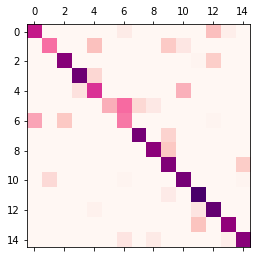

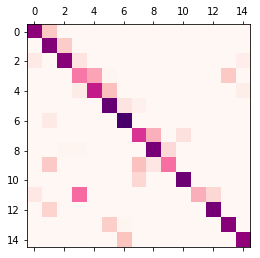

In [16]:
plt.matshow(hmm.transmat_, cmap=plt.cm.RdPu)
plt.show()
transmat_order = hmm.get_state_order('transmat')
hmm.reorder_states(transmat_order)
plt.matshow(hmm.transmat_, cmap=plt.cm.RdPu)
plt.show()

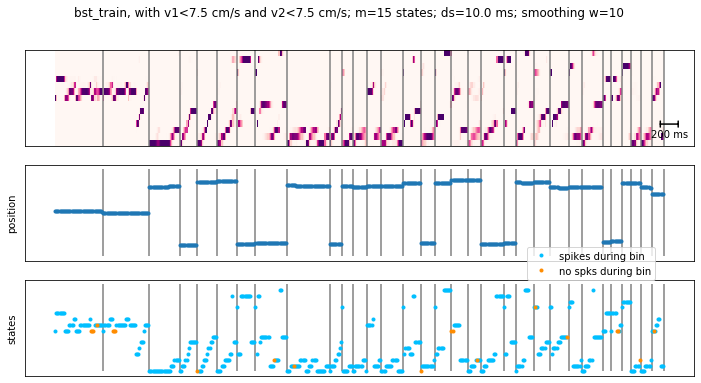

In [17]:
bst = bst_train

active = np.where(bst.n_active_per_bin>0)[0]
inactive = np.where(bst.n_active_per_bin==0)[0]
logprobs, state_sequences, centers = hmm.decode(bst, algorithm='map')

xpos, ypos = get_position(exp_data[session]['posdf'], bst.centers)
spd, _unused = get_speed(exp_data[session]['posdf'], bst.centers)

fig = plt.figure(figsize=(12,6))

ax0 = fig.add_subplot(311)
npl.imagesc(hmm.predict_proba(bst), cmap=plt.cm.RdPu, ax=ax0)
# ax0.plot(xpos)
ax0.vlines(np.cumsum(bst.lengths), -.5 , hmm.n_components-0.5, color='gray')
npl.scalebar.add_scalebar(ax0, sizex=20, labelx='{} ms'.format(round(20*bst.ds*1000)))

ax1 = fig.add_subplot(312)
ax1.plot(xpos, '.')
ax1.vlines(np.cumsum(bst.lengths), 0 , 100, color='gray')
ax1.set_ylabel('position')

ax2 = fig.add_subplot(313)
ax2.plot(active, np.hstack(state_sequences)[active],'.', color='deepskyblue', label='spikes during bin')
ax2.plot(inactive, np.hstack(state_sequences)[inactive],'.', color='darkorange', label='no spks during bin')
ax2.vlines(np.cumsum(bst.lengths), 0 , hmm.n_components, color='gray')
ax2.legend(loc=(0.75,1))
ax2.set_ylabel('states')

npl.no_xticklabels(ax0, ax1, ax2)
npl.no_yticklabels(ax0, ax1, ax2)
npl.no_xticks(ax0,ax1,ax2)
npl.no_yticks(ax0,ax1,ax2)
npl.sync_xlims(ax0, ax1, ax2)

fig.suptitle('bst_train, with v1<{} cm/s and v2<{} cm/s; m={} states; ds={} ms; smoothing w={}'.format(v1*2.5,v2*2.5, hmm.n_components, bst.ds*1000, w))

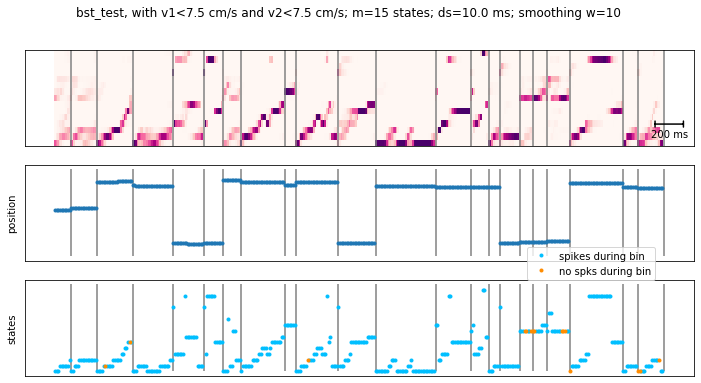

In [18]:
bst = bst_test

active = np.where(bst.n_active_per_bin>0)[0]
inactive = np.where(bst.n_active_per_bin==0)[0]
logprobs, state_sequences, centers = hmm.decode(bst, algorithm='map')

xpos, ypos = get_position(exp_data[session]['posdf'], bst.centers)
spd, _unused = get_speed(exp_data[session]['posdf'], bst.centers)

fig = plt.figure(figsize=(12,6))

ax0 = fig.add_subplot(311)
npl.imagesc(hmm.predict_proba(bst), cmap=plt.cm.RdPu, ax=ax0)
# ax0.plot(xpos)
ax0.vlines(np.cumsum(bst.lengths), -.5 , hmm.n_components-0.5, color='gray')
npl.scalebar.add_scalebar(ax0, sizex=20, labelx='{} ms'.format(round(20*bst.ds*1000)))

ax1 = fig.add_subplot(312)
ax1.plot(xpos, '.')
ax1.vlines(np.cumsum(bst.lengths), 0 , 100, color='gray')
ax1.set_ylabel('position')

ax2 = fig.add_subplot(313)
ax2.plot(active, np.hstack(state_sequences)[active],'.', color='deepskyblue', label='spikes during bin')
ax2.plot(inactive, np.hstack(state_sequences)[inactive],'.', color='darkorange', label='no spks during bin')
ax2.vlines(np.cumsum(bst.lengths), 0 , hmm.n_components, color='gray')
ax2.legend(loc=(0.75,1))
ax2.set_ylabel('states')

npl.no_xticklabels(ax0, ax1, ax2)
npl.no_yticklabels(ax0, ax1, ax2)
npl.no_xticks(ax0,ax1,ax2)
npl.no_yticks(ax0,ax1,ax2)
npl.sync_xlims(ax0, ax1, ax2)

fig.suptitle('bst_test, with v1<{} cm/s and v2<{} cm/s; m={} states; ds={} ms; smoothing w={}'.format(v1*2.5,v2*2.5, hmm.n_components, bst.ds*1000, w))

### Optionally train a HMM on RUN data

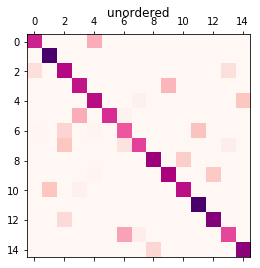

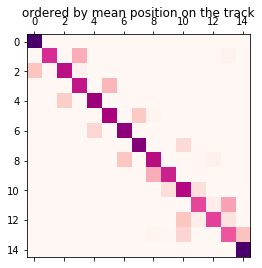

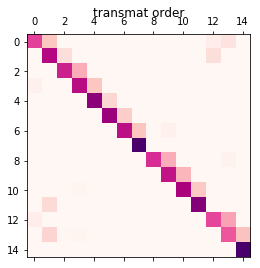

In [19]:
# optionally train a HMM on run data, with which we can do cross-modal decoding, etc.
runspks = exp_data[session]['spikes']._unit_subset(np.arange(1,exp_data[session]['spikes'].n_units))
ds_run = 0.1 # 100 ms
# bst_run = runspks[run_epochs][which_half]._bin(ds=0.125, ds_prime=125, w=10)
bst_run = runspks[run_epochs][which_half]._bin(ds=ds_run, ds_prime=ds_run*1000, w=10)
hmmrun = nel.hmmutils.PoissonHMM(n_components=num_states, random_state=3, verbose=False)
hmmrun.fit(bst_run)

xpos, ypos = get_position(exp_data[session]['posdf'], bst_run.centers)
spd, _unused = get_speed(exp_data[session]['posdf'], bst_run.centers)
x0=0; xl=100; n_extern=50
xx_left = np.linspace(x0,xl,n_extern+1)
xx_mid = np.linspace(x0,xl,n_extern+1)[:-1]; xx_mid += (xx_mid[1]-xx_mid[0])/2
ext = np.digitize(xpos, xx_left) - 1 # spatial bin numbers

extern = hmmrun.fit_ext(bst_run, ext, n_extern=50)

plt.matshow(hmmrun.transmat_, cmap=plt.cm.RdPu)
plt.title('unordered')
plt.show()
mean_order = hmmrun.get_state_order('mean')
hmmrun.reorder_states(mean_order)
plt.matshow(hmmrun.transmat_, cmap=plt.cm.RdPu)
plt.title('ordered by mean position on the track')
plt.show()
transmat_order = hmmrun.get_state_order('transmat')
hmmrun.reorder_states(transmat_order)
plt.matshow(hmmrun.transmat_, cmap=plt.cm.RdPu)
plt.title('transmat order')
plt.show()



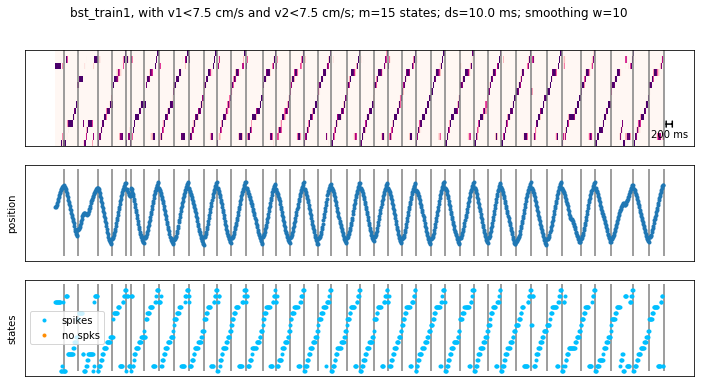

In [20]:
bst = bst_run

active = np.where(bst.n_active_per_bin>0)[0]
inactive = np.where(bst.n_active_per_bin==0)[0]
logprobs, state_sequences, centers = hmmrun.decode(bst, algorithm='map')

xpos, ypos = get_position(exp_data[session]['posdf'], bst.centers)
spd, _unused = get_speed(exp_data[session]['posdf'], bst.centers)

fig = plt.figure(figsize=(12,6))

ax0 = fig.add_subplot(311)
npl.imagesc(hmmrun.predict_proba(bst), cmap=plt.cm.RdPu, ax=ax0)
# ax0.plot(xpos)
ax0.vlines(np.cumsum(bst.lengths), -.5 , hmmrun.n_components-0.5, color='gray')
npl.scalebar.add_scalebar(ax0, sizex=20, labelx='{} ms'.format(round(20*bst.ds*1000)))

ax1 = fig.add_subplot(312)
ax1.plot(xpos, '.')
ax1.vlines(np.cumsum(bst.lengths), 0 , 100, color='gray')
ax1.set_ylabel('position')

ax2 = fig.add_subplot(313)
ax2.plot(active, np.hstack(state_sequences)[active],'.', color='deepskyblue', label='spikes')
ax2.plot(inactive, np.hstack(state_sequences)[inactive],'.', color='darkorange', label='no spks')
ax2.vlines(np.cumsum(bst.lengths), 0 , hmmrun.n_components, color='gray')
ax2.legend()
ax2.set_ylabel('states')
axes=[ax0,ax1,ax2]
npl.no_xticklabels(*axes)
npl.no_yticklabels(*axes)
npl.no_xticks(ax0,ax1,ax2)
npl.no_yticks(ax0,ax1,ax2)
npl.sync_xlims(ax0, ax1, ax2)

fig.suptitle('bst_train1, with v1<{} cm/s and v2<{} cm/s; m={} states; ds={} ms; smoothing w={}'.format(v1*2.5,v2*2.5, hmm.n_components, bst.ds*1000, w))

# Cross-modal decoding

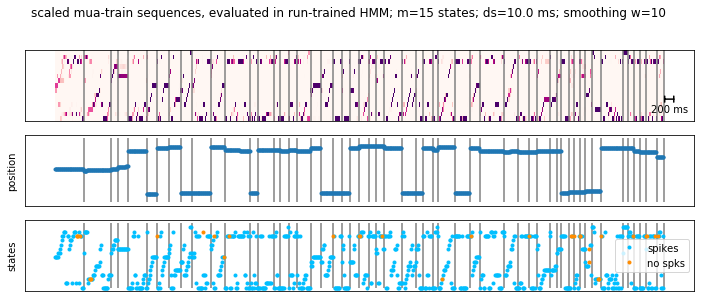

In [34]:
# Get all MUA events for cross modal decoding
bst_mua = mua_st[mua_epochs[which_half]]._bin(ds=ds, ds_prime=10, w=w)
bst = bst_mua

bst._data = bst._data * (ds_run / ds)

active = np.where(bst.n_active_per_bin>0)[0]
inactive = np.where(bst.n_active_per_bin==0)[0]
logprobs, state_sequences, centers = hmmrun.decode(bst, algorithm='map')

xpos, ypos = get_position(exp_data[session]['posdf'], bst.centers)
spd, _unused = get_speed(exp_data[session]['posdf'], bst.centers)

fig = plt.figure(figsize=(12,6))

ax0 = fig.add_subplot(411)
npl.imagesc(hmmrun.predict_proba(bst), cmap=plt.cm.RdPu, ax=ax0)
# ax0.plot(xpos)
ax0.vlines(np.cumsum(bst.lengths), -.5 , hmmrun.n_components-0.5, color='gray')
npl.scalebar.add_scalebar(ax0, sizex=20, labelx='{} ms'.format(round(20*bst.ds*1000)))

ax1 = fig.add_subplot(412)
ax1.plot(xpos, '.')
ax1.vlines(np.cumsum(bst.lengths), 0 , 100, color='gray')
ax1.set_ylabel('position')

ax2 = fig.add_subplot(413)
ax2.plot(active, np.hstack(state_sequences)[active],'.', color='deepskyblue', label='spikes')
ax2.plot(inactive, np.hstack(state_sequences)[inactive],'.', color='darkorange', label='no spks')
ax2.vlines(np.cumsum(bst.lengths), 0 , hmmrun.n_components, color='gray')
ax2.legend()
ax2.set_ylabel('states')
axes=[ax0,ax1,ax2]
npl.no_xticklabels(*axes)
npl.no_yticklabels(*axes)
npl.no_xticks(ax0,ax1,ax2)
npl.no_yticks(ax0,ax1,ax2)
npl.sync_xlims(ax0, ax1, ax2)

fig.suptitle('scaled mua-train sequences, evaluated in run-trained HMM; m={} states; ds={} ms; smoothing w={}'.format(hmm.n_components, bst.ds*1000, w))


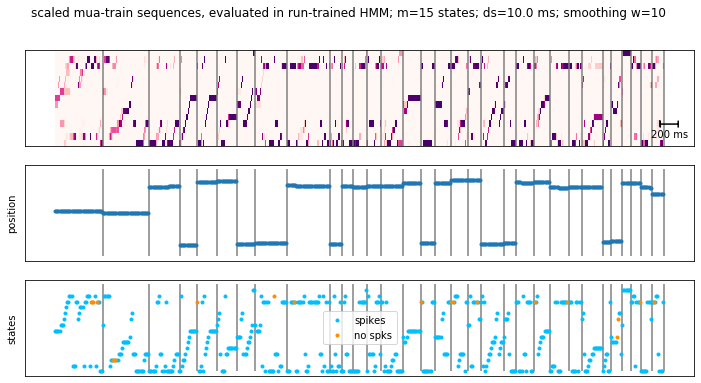

In [21]:
bst = bst_train.copy()

bst._data = bst._data * (ds_run / ds)

active = np.where(bst.n_active_per_bin>0)[0]
inactive = np.where(bst.n_active_per_bin==0)[0]
logprobs, state_sequences, centers = hmmrun.decode(bst, algorithm='map')

xpos, ypos = get_position(exp_data[session]['posdf'], bst.centers)
spd, _unused = get_speed(exp_data[session]['posdf'], bst.centers)

fig = plt.figure(figsize=(12,6))

ax0 = fig.add_subplot(311)
npl.imagesc(hmmrun.predict_proba(bst), cmap=plt.cm.RdPu, ax=ax0)
# ax0.plot(xpos)
ax0.vlines(np.cumsum(bst.lengths), -.5 , hmmrun.n_components-0.5, color='gray')
npl.scalebar.add_scalebar(ax0, sizex=20, labelx='{} ms'.format(round(20*bst.ds*1000)))

ax1 = fig.add_subplot(312)
ax1.plot(xpos, '.')
ax1.vlines(np.cumsum(bst.lengths), 0 , 100, color='gray')
ax1.set_ylabel('position')

ax2 = fig.add_subplot(313)
ax2.plot(active, np.hstack(state_sequences)[active],'.', color='deepskyblue', label='spikes')
ax2.plot(inactive, np.hstack(state_sequences)[inactive],'.', color='darkorange', label='no spks')
ax2.vlines(np.cumsum(bst.lengths), 0 , hmmrun.n_components, color='gray')
ax2.legend()
ax2.set_ylabel('states')
axes=[ax0,ax1,ax2]
npl.no_xticklabels(*axes)
npl.no_yticklabels(*axes)
npl.no_xticks(ax0,ax1,ax2)
npl.no_yticks(ax0,ax1,ax2)
npl.sync_xlims(ax0, ax1, ax2)

fig.suptitle('scaled mua-train sequences, evaluated in run-trained HMM; m={} states; ds={} ms; smoothing w={}'.format(hmm.n_components, bst.ds*1000, w))

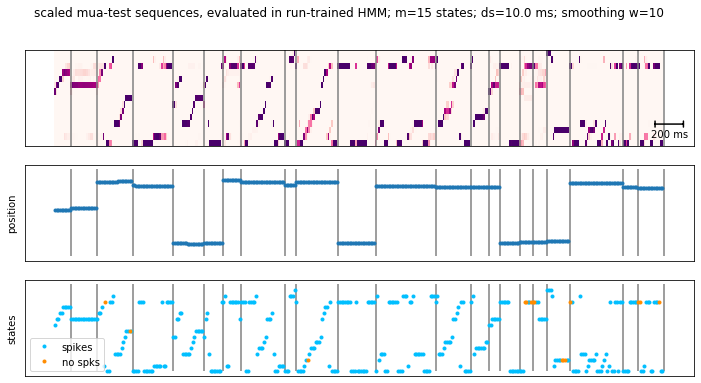

In [22]:
bst = bst_test.copy()

bst._data = bst._data * (ds_run / ds)

active = np.where(bst.n_active_per_bin>0)[0]
inactive = np.where(bst.n_active_per_bin==0)[0]
logprobs, state_sequences, centers = hmmrun.decode(bst, algorithm='map')

xpos, ypos = get_position(exp_data[session]['posdf'], bst.centers)
spd, _unused = get_speed(exp_data[session]['posdf'], bst.centers)

fig = plt.figure(figsize=(12,6))

ax0 = fig.add_subplot(311)
npl.imagesc(hmmrun.predict_proba(bst), cmap=plt.cm.RdPu, ax=ax0)
# ax0.plot(xpos)
ax0.vlines(np.cumsum(bst.lengths), -.5 , hmmrun.n_components-0.5, color='gray')
npl.scalebar.add_scalebar(ax0, sizex=20, labelx='{} ms'.format(round(20*bst.ds*1000)))

ax1 = fig.add_subplot(312)
ax1.plot(xpos, '.')
ax1.vlines(np.cumsum(bst.lengths), 0 , 100, color='gray')
ax1.set_ylabel('position')

ax2 = fig.add_subplot(313)
ax2.plot(active, np.hstack(state_sequences)[active],'.', color='deepskyblue', label='spikes')
ax2.plot(inactive, np.hstack(state_sequences)[inactive],'.', color='darkorange', label='no spks')
ax2.vlines(np.cumsum(bst.lengths), 0 , hmmrun.n_components, color='gray')
ax2.legend()
ax2.set_ylabel('states')
axes=[ax0,ax1,ax2]
npl.no_xticklabels(*axes)
npl.no_yticklabels(*axes)
npl.no_xticks(ax0,ax1,ax2)
npl.no_yticks(ax0,ax1,ax2)
npl.sync_xlims(ax0, ax1, ax2)

fig.suptitle('scaled mua-test sequences, evaluated in run-trained HMM; m={} states; ds={} ms; smoothing w={}'.format(hmm.n_components, bst.ds*1000, w))

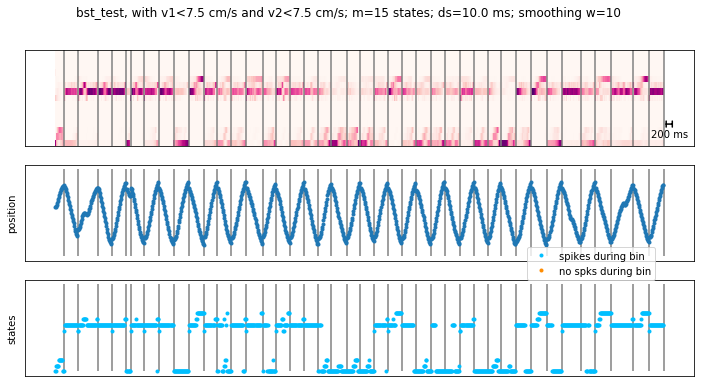

In [23]:
bst = bst_run.copy()

bst._data = bst._data * (ds / ds_run)

active = np.where(bst.n_active_per_bin>0)[0]
inactive = np.where(bst.n_active_per_bin==0)[0]
logprobs, state_sequences, centers = hmm.decode(bst, algorithm='map')

xpos, ypos = get_position(exp_data[session]['posdf'], bst.centers)
spd, _unused = get_speed(exp_data[session]['posdf'], bst.centers)

fig = plt.figure(figsize=(12,6))

ax0 = fig.add_subplot(311)
npl.imagesc(hmm.predict_proba(bst), cmap=plt.cm.RdPu, ax=ax0)
# ax0.plot(xpos)
ax0.vlines(np.cumsum(bst.lengths), -.5 , hmm.n_components-0.5, color='gray')
npl.scalebar.add_scalebar(ax0, sizex=20, labelx='{} ms'.format(round(20*bst.ds*1000)))

ax1 = fig.add_subplot(312)
ax1.plot(xpos, '.')
ax1.vlines(np.cumsum(bst.lengths), 0 , 100, color='gray')
ax1.set_ylabel('position')

ax2 = fig.add_subplot(313)
ax2.plot(active, np.hstack(state_sequences)[active],'.', color='deepskyblue', label='spikes during bin')
ax2.plot(inactive, np.hstack(state_sequences)[inactive],'.', color='darkorange', label='no spks during bin')
ax2.vlines(np.cumsum(bst.lengths), 0 , hmm.n_components, color='gray')
ax2.legend(loc=(0.75,1))
ax2.set_ylabel('states')

npl.no_xticklabels(ax0, ax1, ax2)
npl.no_yticklabels(ax0, ax1, ax2)
npl.no_xticks(ax0,ax1,ax2)
npl.no_yticks(ax0,ax1,ax2)
npl.sync_xlims(ax0, ax1, ax2)

fig.suptitle('bst_test, with v1<{} cm/s and v2<{} cm/s; m={} states; ds={} ms; smoothing w={}'.format(v1*2.5,v2*2.5, hmm.n_components, bst.ds*1000, w))

## Save results using pickle

Dill is usually better, but if pickle is good enough, we don't want to have to force people to use yet another dependency.

In [24]:
save_data = False

if save_data:
    data_to_store = dict( (var, eval(var)) for var in ['mua_epochs_train',
                                                       'mua_epochs_test',
                                                       'bst_train',
                                                       'bst_test',
                                                       'exp_data',
                                                       'session',
                                                       'hmm'])

    with open('tempdata.pkl', 'wb') as handle:
        pickle.dump(data_to_store, handle, protocol=pickle.HIGHEST_PROTOCOL)
    
    del data_to_store

## LFP-based "ripple" event detection

In [25]:
### filter LFP to the ripple band, 150--250 Hz
ripplelfp1 = nel.filtering.ripple_band_filter(lfp1)

# compute envelope of filtered signal
envelope1 = nel.utils.signal_envelope1D(ripplelfp1)

# add envelope back into filtered data (optional)
ripplelfp1.add_signal(envelope1)

# determine LFP event bounds:
ripple_bounds_idx1, ripple_maxes1, _ = nel.utils.get_events_boundaries(
    x = envelope1.ydata,
    PrimaryThreshold = envelope1.mean() + 3*envelope1.std(),
    SecondaryThreshold = envelope1.mean(),
    minThresholdLength = 0.015, # 15 ms
    minLength = 0.07, # 70 ms
    maxLength = 0.5,  # 500 ms
    ds = 1/envelope1.fs
)

if len(ripple_bounds_idx1) == 0:
    raise ValueError("no ripple events detected")

# store ripple bounds in an EpochArray
ripple_epochs1 = nel.EpochArray(envelope1.time[ripple_bounds_idx1], fs=1)

# restrict ripple events to where the animal was running less than x units/sec
warnings.warn("still need to restrict to animal velocity")

# extract spike sequences associated to ripple events
ripple_st1 = st1[ripple_epochs1]

# throw away unit 0 that corresponded to unsortable spikes
ripple_st1 = ripple_st1._unit_subset(np.arange(1,ripple_st1.n_units))

Fix me in the future!
labels not supported yet!
